# **Wine Quality Prediction**

**Introduction**

Wine is an alcoholic beverage made from fermented grapes. Yeast consumes the sugar in the grapes and converts it to ethanol, carbon dioxide, and heat. It is a pleasant tasting alcoholic beverage. It will definitely be interesting to analyze the physicochemical attributes of wine and understand their relationships and significance with wine quality and types classifications. To do this, We will proceed according to the standard Machine Learning and data mining workflow models like the CRISP-DM model, mainly to:

- Predict if each wine sample is a red or white wine.
- Predict the quality of each wine sample, which can be low, medium, or high.
- The dataset are related to red and white variants of the "Vinho Verde" wine. Vinho verde is a unique product from the Minho (northwest) region of Portugal. Medium in alcohol, it is particularly appreciated due to its freshness (specially in the summer). 
- This dataset is public available for research purposes only, for more information, read [Cortez et al., 2009](http://www3.dsi.uminho.pt/pcortez/wine5.pdf). Due to privacy and logistic issues, only physicochemical (inputs) and sensory (the output) variables are available (e.g. there is no data about grape types, wine brand, wine selling price, etc.).

**Attribute Information:**

Input variables (based on physicochemical tests): 1 - fixed acidity 2 - volatile acidity 3 - citric acid 4 - residual sugar 5 - chlorides 6 - free sulfur dioxide 7 - total sulfur dioxide 8 - density 9 - pH 10 - sulphates 11 - alcohol Output variable (based on sensory data): 12 - quality (score between 0 and 10)

**About the Dataset:**

- The classes are ordered and not balanced (e.g. there are munch more normal wines than excellent or poor ones).
- Outlier detection algorithms could be used to detect the few excellent or poor wines.
- Also, we are not sure if all input variables are relevant. So it could be interesting to test feature selection methods.

##  Importing Libraries & getting Data


### Import Packages

In [2]:
import os
import warnings
warnings.simplefilter(action = 'ignore', category=FutureWarning)
warnings.filterwarnings('ignore')
def ignore_warn(*args, **kwargs):
    pass

warnings.warn = ignore_warn #ignore annoying warning (from sklearn and seaborn)

import numpy as np
import pandas as pd
import pylab 
import seaborn as sns
sns.set(style="ticks", color_codes=True, font_scale=1.5)
from matplotlib import pyplot as plt
from matplotlib.ticker import FormatStrFormatter
from matplotlib.colors import ListedColormap
%matplotlib inline
import mpl_toolkits
from mpl_toolkits.mplot3d import Axes3D
from graphviz import Source
from IPython.display import Image

from scipy.stats import skew, norm, probplot, boxcox, f_oneway
from scipy import interp
from sklearn.base import BaseEstimator, TransformerMixin, clone, ClassifierMixin
from sklearn import metrics, tree
from sklearn.preprocessing import LabelEncoder, label_binarize, StandardScaler, PolynomialFeatures, MinMaxScaler

from sklearn.decomposition import PCA
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis as LDA
from sklearn.pipeline import Pipeline, make_pipeline
from sklearn.model_selection import GridSearchCV, cross_val_score, KFold, cross_val_predict, train_test_split
from sklearn.metrics import roc_auc_score, roc_curve, auc, accuracy_score

from sklearn.linear_model import LogisticRegression
from keras.models import Sequential
from keras.layers import Dense
from keras.wrappers.scikit_learn import KerasClassifier
from sklearn.tree import DecisionTreeClassifier
import xgboost as xgb
from sklearn.gaussian_process import GaussianProcessClassifier
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, ExtraTreesClassifier
from sklearn.ensemble.gradient_boosting import GradientBoostingClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC, LinearSVC
from mlxtend.classifier import StackingClassifier

### Load Dataset
Load dataset, create the quality label based on the quality score according to:
- Low for less or equal to 5
- Medium between 6 and 7
- High for more then 7

In [3]:
wines = pd.read_csv('../input/winequalityN.csv')

wines['quality_label'] = wines.quality.apply(lambda q: 'low' if q <= 5 else 'medium' if q <= 7 else 'high')
#wines.quality_label = pd.Categorical(wines.quality_label, categories=['low', 'medium', 'high'], ordered=True)

# re-shuffle records just to randomize data points
wines = wines.sample(frac=1, random_state=101).reset_index(drop=True)

## Exploratory Data Analysis (EDA)


In [4]:
def rstr(df, pred=None): 
    obs = df.shape[0]
    types = df.dtypes
    counts = df.apply(lambda x: x.count())
    uniques = df.apply(lambda x: [x.unique()])
    nulls = df.apply(lambda x: x.isnull().sum())
    distincts = df.apply(lambda x: x.unique().shape[0])
    missing_ration = (df.isnull().sum()/ obs) * 100
    skewness = df.skew()
    kurtosis = df.kurt() 
    print('Data shape:', df.shape)
    
    if pred is None:
        cols = ['types', 'counts', 'distincts', 'nulls', 'missing ration', 'uniques', 'skewness', 'kurtosis']
        str = pd.concat([types, counts, distincts, nulls, missing_ration, uniques, skewness, kurtosis], axis = 1)

    else:
        corr = df.corr()[pred]
        str = pd.concat([types, counts, distincts, nulls, missing_ration, uniques, skewness, kurtosis, corr], axis = 1, sort=False)
        corr_col = 'corr '  + pred
        cols = ['types', 'counts', 'distincts', 'nulls', 'missing_ration', 'uniques', 'skewness', 'kurtosis', corr_col ]
    
    str.columns = cols
    dtypes = str.types.value_counts()
    print('___________________________\nData types:\n',str.types.value_counts())
    print('___________________________')
    return str

In [5]:
details = rstr(wines, 'quality')
details.sort_values(by='missing_ration', ascending=False)

Data shape: (6497, 14)
___________________________
Data types:
 float64    11
object      2
int64       1
Name: types, dtype: int64
___________________________


,types,counts,distincts,nulls,missing_ration,uniques,skewness,kurtosis,corr quality
fixed acidity,float64,6487,107,10,0.153917,"[[7.3, 6.9, 9.5, 8.2, 7.9, 9.8, 7.0, 7.2, 6.5,...",1.722805,5.057727,-0.077031
pH,float64,6488,109,9,0.138525,"[[3.28, 3.51, 3.12, 3.31, 3.27, 3.19, 3.05, 3....",0.386966,0.370068,0.019366
volatile acidity,float64,6489,188,8,0.123134,"[[0.28, 1.09, 0.46, 0.31, 0.34, 0.13, 0.25, 0....",1.495512,2.827081,-0.265953
sulphates,float64,6493,112,4,0.061567,"[[0.82, 0.43, 0.74, 0.68, 0.51, 0.55, 0.38, 0....",1.798467,8.659892,0.038729
citric acid,float64,6494,90,3,0.046175,"[[0.42, 0.06, 0.24, 0.4, 0.41, 0.39, 0.37, 0.2...",0.473032,2.401582,0.085706
residual sugar,float64,6495,317,2,0.030783,"[[14.4, 2.1, 2.7, 2.2, 4.9, 1.4, 12.85, 2.0, 1...",1.435000,4.358134,-0.036825
chlorides,float64,6495,215,2,0.030783,"[[0.04, 0.061, 0.092, 0.057999999999999996, 0....",5.399849,50.894874,-0.200886
type,object,6497,2,0,0.000000,"[[white, red]]",NaN,NaN,NaN
free sulfur dioxide,float64,6497,135,0,0.000000,"[[49.0, 12.0, 14.0, 6.0, 31.0, 3.0, 36.0, 55.0...",1.220066,7.906238,0.055463
total sulfur dioxide,float64,6497,276,0,0.000000,"[[173.0, 31.0, 44.0, 10.0, 153.0, 7.0, 105.0, ...",-0.001177,-0.371664,-0.041385


### Nulls Check and Cleaning

As you may notice we have very few records with null characteristics, so let's evaluate the option to simply eliminate rows with nulls instead of entering with medians and modes.

In [6]:
wines.quality_label.value_counts()

medium    3915
low       2384
high       198
Name: quality_label, dtype: int64

In [7]:
wines.dropna().quality_label.value_counts()

medium    3894
low       2372
high       197
Name: quality_label, dtype: int64

As you can notice we will lose only 1 record of high, 12 of low and 21 of medium, out of a total of 34 (0,5%) being safe deletes them. 

In [8]:
wines.dropna(inplace=True)

class DataFrameImputer(TransformerMixin):

    def __init__(self):
        """
        Impute missing values:
        - Columns of dtype object are imputed with the most frequent value in column.
        - Columns of other types are imputed with mean of column.
        """
    def fit(self, X, y=None):

        self.fill = pd.Series([X[c].value_counts().index[0]
            if X[c].dtype == np.dtype('O') else X[c].mean() for c in X],
            index=X.columns)

        return self

    def transform(self, X, y=None):
        return X.fillna(self.fill)

wines = DataFrameImputer().fit_transform(wines)

After the nulls treatments, we will see below the distributions of the data in the qualities by their types, and confirming the imbalance between classes, especially with few cases in high quality.

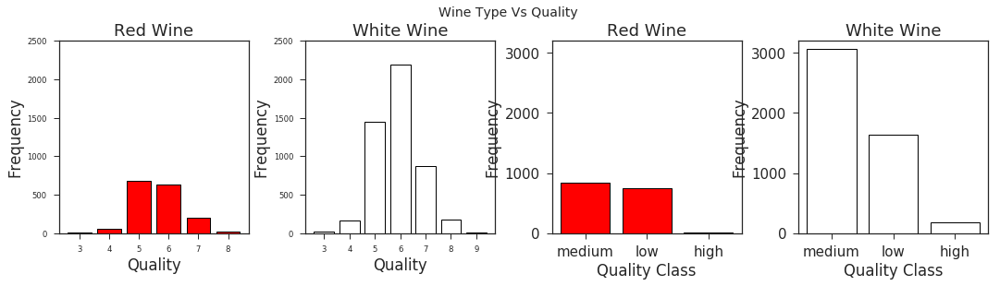

In [9]:
fig = plt.figure(figsize = (18, 4))
title = fig.suptitle("Wine Type Vs Quality", fontsize=14)
fig.subplots_adjust(top=0.85, wspace=0.3)

ax1 = fig.add_subplot(1,4, 1)
ax1.set_title("Red Wine")
ax1.set_xlabel("Quality")
ax1.set_ylabel("Frequency") 
rw_q = wines.quality[wines.type == 'red'].value_counts()
rw_q = (list(rw_q.index), list(rw_q.values))
ax1.set_ylim([0, 2500])
ax1.tick_params(axis='both', which='major', labelsize=8.5)
bar1 = ax1.bar(rw_q[0], rw_q[1], color='red', edgecolor='black', linewidth=1)


ax2 = fig.add_subplot(1,4, 2)
ax2.set_title("White Wine")
ax2.set_xlabel("Quality")
ax2.set_ylabel("Frequency") 
ww_q = wines.quality[wines.type == 'white'].value_counts()
ww_q = (list(ww_q.index), list(ww_q.values))
ax2.set_ylim([0, 2500])
ax2.tick_params(axis='both', which='major', labelsize=8.5)
bar2 = ax2.bar(ww_q[0], ww_q[1], color='white', edgecolor='black', linewidth=1)

ax3 = fig.add_subplot(1,4, 3)
ax3.set_title("Red Wine")
ax3.set_xlabel("Quality Class")
ax3.set_ylabel("Frequency") 
rw_q = wines.quality_label[wines.type == 'red'].value_counts()
rw_q = (list(rw_q.index), list(rw_q.values))
ax3.set_ylim([0, 3200])
bar3 = ax3.bar(list(range(len(rw_q[0]))), rw_q[1], color='red', edgecolor='black', linewidth=1, tick_label =rw_q[0])

ax4 = fig.add_subplot(1,4, 4)
ax4.set_title("White Wine")
ax4.set_xlabel("Quality Class")
ax4.set_ylabel("Frequency") 
ww_q = wines.quality_label[wines.type == 'white'].value_counts()
ww_q = (list(ww_q.index), list(ww_q.values))
ax4.set_ylim([0, 3200])
bar4 = ax4.bar(list(range(len(ww_q[0]))), ww_q[1], color='white', edgecolor='black', linewidth=1, tick_label =ww_q[0])

### Understanding Wine and Types

Wine is an alcoholic beverage made from grapes which is fermented without the addition of sugars, acids, enzymes, water, or other nutrients

Red wine is made from dark red and black grapes. The color usually ranges from various shades of red, brown and violet. This is produced with whole grapes including the skin which adds to the color and flavor of red wines, giving it a rich flavor.

White wine is made from white grapes with no skins or seeds. The color is usually straw-yellow, yellow-green, or yellow-gold. Most white wines have a light and fruity flavor as compared to richer red wines.
### Understanding Wine Attributes and Properties 
#### Acidity 
Acids are one of the fundamental properties of wine and contribute greatly to the taste of the wine,  Acidity in food and drink tastes tart and zesty. Tasting acidity is also sometimes confused with alcohol. Wines with higher acidity feel lighter-bodied because they come across as “spritzy”. Reducing acids significantly might lead to wines tasting flat. If you prefer a wine that is more rich and round, you enjoy slightly less acidity.

***Acidity Characteristics***
- Tingling sensation that focuses on the front and sides of your tongue. Feels like pop rocks.
- If you rub your tongue to the roof of your mouth it feels gravelly.
- Your mouth feels wet, like you bit into an apple.

***Acid Types and Measures***
 - **fixed acidity:**  Fixed acids include tartaric, malic, citric, and succinic acids which are found in grapes (except succinic). This variable is usually expressed in $\frac{g(tartaricacid)}{dm^3}$ in the dataset.
 - **volatile acidity:** These acids are to be distilled out from the wine before completing the production process. It is primarily constituted of acetic acid though other acids like lactic, formic and butyric acids might also be present. Excess of volatile acids are undesirable and lead to unpleasant flavor. In the US, the legal limits of volatile acidity are 1.2 g/L for red table wine and 1.1 g/L for white table wine. The volatile acidity is expressed in $\frac{g(aceticacid)}{dm^3}$ in the dataset.
 - **citric acid:** This is one of the fixed acids which gives a wine its freshness. Usually most of it is consumed during the fermentation process and sometimes it is added separately to give the wine more freshness. It's usually expressed in $\frac{g}{dm^3}$ in the dataset.
 - **pH:** Also known as the potential of hydrogen, this is a numeric scale to specify the acidity or basicity the wine. Fixed acidity contributes the most towards the pH of wines. You might know, solutions with a pH less than 7 are acidic, while solutions with a pH greater than 7 are basic. With a pH of 7, pure water is neutral. Most wines have a pH between 2.9 and 3.9 and are therefore acidic.
   
#### Sweetness
How sweet or dry (not sweet) is the wine? Our human perception of sweet starts at the tip of our tongue. Often, the very first impression of a wine is its level of sweetness. To taste sweetneww, focus your attention on the taste buds on the tip of your tongue. Are your taste buds tingling?–an indicator of sweetness. Believe it or not, many dry wines can have a hint of sweetness to make them more full-bodied.

***How to Taste Sweetness in Wine***
- Tingling sensation on the tip of your tongue.
- Slight oily sensation in the middle of your tongue that lingers.
- Wine has a higher viscosity; wine tears on side of glass slowly. (also an indicator of high ABV)
- Dry red wines such as cabernet sauvignon often have up to 0.9 g/L of residual sugar (common with cheap wines).
- A bone-dry wine can often be confused with a wine with high tannin.
    
***Sweetness Measure:***
- **residual sugar:** This typically refers to the natural sugar from grapes which remains after the fermentation process stops, or is stopped. 

#### Salty
Salty is not a common wine descriptor. Salinity is a concern in dry locations when frequent irrigation increases soil salinity, which increases wine salinity. Soil composition often doesn’t translate in the way you’d expect into grape composition; salt is, unfortunately, an exception.

***Salty Measure:***
- **chlorides:**  Chloride concentration in the wine is influenced by territory and its highest levels are found in wines coming from countries where irrigation is carried out using salty water or in areas with brackish terrains. This is usually a major contributor to saltiness in wine. 

#### Sulfites 
Sulfites in wine are chemical compounds (sulphur dioxide, or SO2) that occur naturally, to varying degree, in all types of wine.  Sulfur Dioxide is naturally found in wines and is a byproduct of fermentation, but most winemakers choose to add a little extra to prevent the growth of undesirable yeasts and microbes, as well as to protect against oxidation.

Sulfur dioxide inhibits yeasts, preventing sweet wines from refermenting in the bottle. It’s an antioxidant, keeping the wine fresh and untainted by oxygen. 

Ancient cultures in Greece, Rome, and Egypt, used sulfites to sterilise their containers of wine. Because sulfites are anti-microbial, it has the ability of killing off unwanted bacterias and wild yeast during wine making.

Very sensitive tasters have been noted to smell sulfur compounds in wine, although sulfur compounds are somewhat unrelated to sulfites. Sulfur compounds in wine called thiols range in flavor from citrus-like smells to cooked egg-like smells.

What’s interesting is that the warmer the wine, the more molecular sulfur it releases. This is why some wines have a nasty cooked-egg aroma when you open them. You can fix this issue by decanting your wine and chilling for about 15-30 minutes.

***How Much Sulfur is in Wine?***
- Wines with lower acidity need more sulfites than higher acidity wines. At pH 3.6 and above wines are much less stable and sulfites are necessary for shelf-life.
- Wines with more color (i.e. red wines) tend to need less sulfites than clear wines (i.e. white wines). A typical dry white wine may have around 100 mg/L whereas a typical dry red wine will have around 50–75 mg/L.
- Wines with higher sugar content tend to need more sulfites to prevent secondary fermentation of the remaining sugar.
- Wines that are warmer in temperature release free sulfur compounds (the nasty sulfur smell) and can be “fixed” simply through decanting and chilling the wine.

***Sulfites Measure:***
- **sulphates:** These are mineral salts containing sulfur. Sulphates are to wine as gluten is to food. They are a regular part of the winemaking around the world and are considered essential.
  
- **free sulfur dioxide:** This is the part of the sulphur dioxide that when added to a wine is said to be free after the remaining part binds. Winemakers will always try to get the highest proportion of free sulphur to bind. They are also known as sulfites and too much of it is undesirable and gives a pungent odour.


#### Alcohol

Alcohol is formed as a result of yeast converting sugar during the fermentation process. The percentage of alcohol can vary from wine to wine. 
We interpret alcohol using many different taste receptors which is why it can taste bitter, sweet, spicy, and oily all at once. Your genetics actually plays a role in how bitter or sweet alcohol tastes. Regardless, we can all sense alcohol towards the backs of our mouths in our throats as a warming sensation. 

#### Classifications Attributes:

- **wine_type:** Since we originally had two datasets for red and white wine, we introduced this attribute in the final merged dataset which indicates the type of wine for each data point. A wine can either be a 'red' or a 'white' wine. One of the predictive models we will build in this chapter would be such that we can predict the type of wine by looking at other wine attributes.

- **quality:** Wine experts graded the wine quality between 0 (very bad) and 10 (very excellent). The eventual quality score is the median of at least three evaluations made by the same wine experts.

### Descriptive Statistics
#### By Type

In [10]:
subset_attributes = wines.columns
rs = round(wines.loc[wines.type == 'red', subset_attributes].describe(),2)
ws = round(wines.loc[wines.type == 'white', subset_attributes].describe(),2)
pd.concat([rs, ws], axis=0, keys=['Red Wine Statistics', 'White Wine Statistics']).T

Red Wine Statistics          ...   White Wine Statistics        
                                   count   mean   ...                     75%     max
fixed acidity                     1593.0   8.33   ...                    7.30   14.20
volatile acidity                  1593.0   0.53   ...                    0.32    1.10
citric acid                       1593.0   0.27   ...                    0.39    1.66
residual sugar                    1593.0   2.54   ...                    9.90   65.80
chlorides                         1593.0   0.09   ...                    0.05    0.35
free sulfur dioxide               1593.0  15.84   ...                   46.00  289.00
total sulfur dioxide              1593.0  46.46   ...                  167.00  440.00
density                           1593.0   1.00   ...                    1.00    1.04
pH                                1593.0   3.31   ...                    3.28    3.82
sulphates                         1593.0   0.66   ...                    0.55    1.08
alcohol                           1593.0  10.42   ...                   11.40   14.20
quality                           1593.0   5.64   ...                    6.00    9.00

[12 rows x 16 columns]

Highlights from descriptive statisct above:
- Mean residual sugar and total sulfur dioxide content in white wine seems to be much higher than red wine.
- Mean value of sulphates, fixed acidity and volatile acidity seem to be higher in red wine as compared to white wine.
- From all numbers, we can observe that citric acid is more present in white than red wines.
- In general, white wines has half concentrations of chlorides then red wines.
- Although in Ph the difference seems small it is interesting to note that it is slightly larger in green red wines.

#### By Quality

In [11]:
#subset_attributes = ['alcohol', 'volatile acidity', 'pH', 'quality']
ls = round(wines[wines['quality_label'] == 'low'][subset_attributes].describe(),2)
ms = round(wines[wines['quality_label'] == 'medium'][subset_attributes].describe(),2)
hs = round(wines[wines['quality_label'] == 'high'][subset_attributes].describe(),2)
pd.concat([ls, ms, hs], axis=0, keys=['Low Quality Wine', 'Medium Quality Wine', 'High Quality Wine']).T

Low Quality Wine           ...   High Quality Wine        
                                count    mean   ...                 75%     max
fixed acidity                  2372.0    7.33   ...                7.30   12.60
volatile acidity               2372.0    0.40   ...                0.35    0.85
citric acid                    2372.0    0.30   ...                0.36    0.74
residual sugar                 2372.0    5.63   ...                7.60   14.80
chlorides                      2372.0    0.06   ...                0.04    0.12
free sulfur dioxide            2372.0   29.48   ...               43.00  105.00
total sulfur dioxide           2372.0  119.21   ...              145.00  212.50
density                        2372.0    1.00   ...                0.99    1.00
pH                             2372.0    3.21   ...                3.33    3.72
sulphates                      2372.0    0.52   ...                0.60    1.10
alcohol                        2372.0    9.87   ...               12.60   14.00
quality                        2372.0    4.88   ...                8.00    9.00

[12 rows x 24 columns]

Highlights from descriptive statisct of quality perspective above:
- It is interesting how alcohol does not give us much variation to distinguish whether the vine is white or red, but it makes a lot of difference in quality. Note that the higher the quality the higher the average alcohol concentration, increased by about 1% at each level. Although lower quality wines have the lowest standard deviation.
- The chlorides and volatile acidity are less present and presented smaller standard deviation in wines of higher quality.
- The free sulfur dioxide is higher with higher quality, but their standard deviation decrease with the increase the quality.
- Higher quality has less fixed acidity, but the standard deviation is slightly higher in mean quality

### Inferential Statistics

The general notion of inferential statistics is to draw inferences and propositions of a population using a data sample. The idea is to use statistical methods and models to draw statistical inferences from a given hypotheses. Each hypothesis consists of a null hypothesis and an alternative hypothesis. Based on statistical test results, if the result is statistically significant based on pre-set significance levels (e.g., if obtained p-value is less than 5% significance level), we reject the null hypothesis in favor of the alternative hypothesis. Otherwise, if the results is not statistically significant, we conclude that our null hypothesis was correct.

A great statistical model to prove or disprove the difference in mean among subsets of data is to use the one-way ANOVA test. ANOVA stands for “analysis of variance,” which is a nifty statistical model and can be used to analyze statistically significant differences among means or averages of various groups. This is basically achieved using a statistical test that helps us determine whether or not the means of several groups are equal. 

The alternative hypotheses, H<sub>A</sub>, tells us that there exists at least two group means that are statistically significantly different from each other. Usually the F-statistic and the associated p-value from it is used to determine the statistical significance. Typically a p-value less than 0.05 is taken to be a statistically significant result where we reject the null hypothesis in favor of the original. 

So let's evaluate the hypotheses of each of our previous highlights through the statistical inference test

In [12]:
def type_inf_stat_test(feature):
    F, p = f_oneway(wines[wines.type == 'red'][feature], 
                    wines[wines.type == 'white'][feature])
    if p <= 0.05:
        msg = 'Reject'
    else:
        msg = 'Acept'
    print('F Statistic: {:.2f} \tp-value: {:.3f} \tNull Hypothesis: {}'.format(F, p, msg))
    
def quality_inf_stat_test(feature):
    F, p = f_oneway(wines[wines.quality_label == 'low'][feature], 
                    wines[wines.quality_label == 'medium'][feature], 
                    wines[wines.quality_label == 'high'][feature])
    if p <= 0.05:
        msg = 'Reject'
    else:
        msg = 'Acept'
    print('F Statistic: {:.2f} \tp-value: {:.3f} \tNull Hypothesis: {}'.format(F, p, msg))

In [13]:
print('ANOVA test across wine samples with different types:\n')
# - Mean residual sugar and total sulfur dioxide content in white wine seems to be much higher than red wine.
type_inf_stat_test('residual sugar')
type_inf_stat_test('total sulfur dioxide')
#- Mean value of sulphates, fixed acidity and volatile acidity seem to be higher in red wine as compared to white wine.
type_inf_stat_test('sulphates')
type_inf_stat_test('fixed acidity')
type_inf_stat_test('volatile acidity')
#- From all numbers, we can observe that citric acid is more present in white than red wines.
type_inf_stat_test('citric acid')
#- In general, white wines has half concentrations of chlorides then red wines.
type_inf_stat_test('chlorides')
#- Although in Ph the difference seems small it is interesting to note that it is slightly larger in green red wines.
type_inf_stat_test('pH')

ANOVA test across wine samples with different types:

F Statistic: 898.19 	p-value: 0.000 	Null Hypothesis: Reject
F Statistic: 6225.78 	p-value: 0.000 	Null Hypothesis: Reject
F Statistic: 2005.69 	p-value: 0.000 	Null Hypothesis: Reject
F Statistic: 2025.60 	p-value: 0.000 	Null Hypothesis: Reject
F Statistic: 4812.72 	p-value: 0.000 	Null Hypothesis: Reject
F Statistic: 231.26 	p-value: 0.000 	Null Hypothesis: Reject
F Statistic: 2304.04 	p-value: 0.000 	Null Hypothesis: Reject
F Statistic: 781.42 	p-value: 0.000 	Null Hypothesis: Reject


In [14]:
print('ANOVA test across wine samples with different levels of quality:\n')
#- alcohol makes a lot of difference in quality. Although lower quality wines have the lowest standard deviation.
quality_inf_stat_test('alcohol')
#- The chlorides and volatile acidity are less present and presented smaller standard deviation in wines of higher quality.
quality_inf_stat_test('chlorides')
quality_inf_stat_test('volatile acidity')
#- The free sulfur dioxide is higher with higher quality, but their standard deviation decrease with the increase the quality.
quality_inf_stat_test('free sulfur dioxide')
#- Higher quality has less fixed acidity, but the standard deviation is slightly higher in mean quality
quality_inf_stat_test('fixed acidity')

ANOVA test across wine samples with different levels of quality:

F Statistic: 669.32 	p-value: 0.000 	Null Hypothesis: Reject
F Statistic: 120.76 	p-value: 0.000 	Null Hypothesis: Reject
F Statistic: 251.32 	p-value: 0.000 	Null Hypothesis: Reject
F Statistic: 10.22 	p-value: 0.000 	Null Hypothesis: Reject
F Statistic: 20.09 	p-value: 0.000 	Null Hypothesis: Reject


### Check for any correlations between features
The correlation matrix is identical to a covariance matrix computed from standardized data. The correlation matrix is a square matrix that contains the Pearson product-moment correlation coefficients.

To fit a linear regression model, we are interested in those features that have a high correlation with our target variable. So, let's prepare the dataset and the type and quality label targets variables. 

In [15]:
# re-shuffle records just to randomize data points
wines = wines.sample(frac=1, random_state=101).reset_index(drop=True)

class_tp = LabelEncoder()
y_tp = class_tp.fit_transform(wines.type.values) # 1 - White; 0 - Red
wines['color'] = y_tp

class_ql = {'low':0, 'medium': 1, 'high': 2}
y_ql = wines.quality_label.map(class_ql)

#### Check for correlations based on wines types
Now, I will make a zoom in these features in order of their correlation with type of wine:

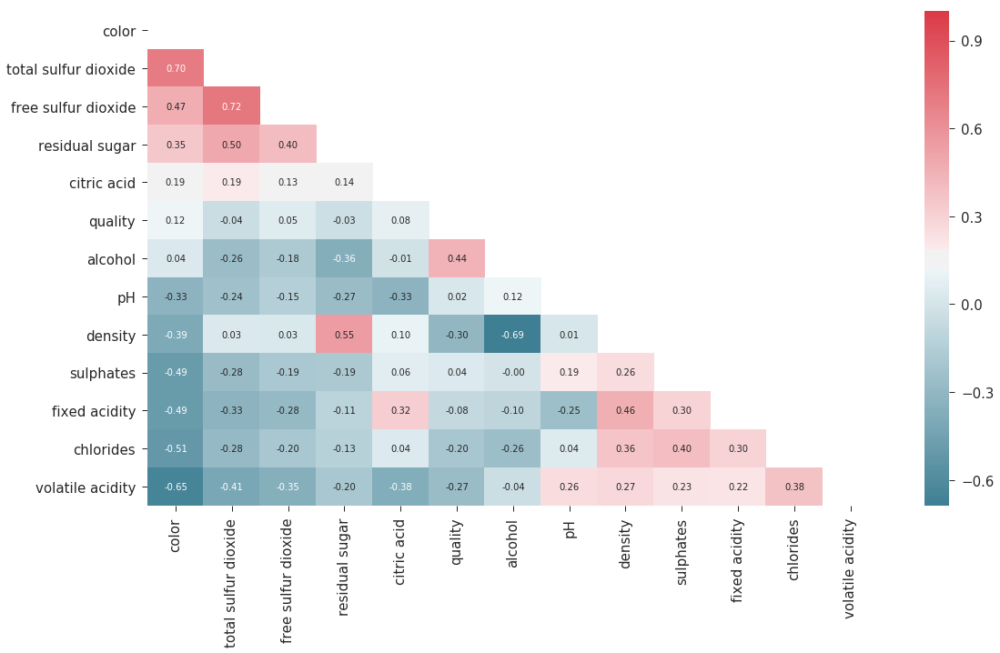

In [16]:
corr = wines.corr()
top_corr_cols = corr.color.sort_values(ascending=False).keys()
top_corr = corr.loc[top_corr_cols, top_corr_cols]
dropSelf = np.zeros_like(top_corr)
dropSelf[np.triu_indices_from(dropSelf)] = True
plt.figure(figsize=(18, 10))
sns.heatmap(top_corr, cmap=sns.diverging_palette(220, 10, as_cmap=True), annot=True, fmt=".2f", mask=dropSelf)
sns.set(font_scale=1.5)
plt.show()
del corr, dropSelf, top_corr

While most of the correlations are weak, we can see that:
- Total and free sulfur dioxide has the higest correlation with white wines and each other. In fact, the second is a parcel of the fisrt and it is represent a colinearity that can be a problamem for linear classifiers, special if the target will predict the color, in that case we need drop the  free sulfur dioxide.
- The residual sugar has a half relation to the total sulfur dioxide and 0.40 with free, it is a god indication that wich more residual sugar more sulfur dioxide is added by the winemaker. The 0.5 indicates that white wine tend to have more residual sugar then red wine.
- Densite has a relatively high positive correlation to residual sugar and relatively high negative correlation to alcohol.
- The chlorides and volatile acidity has -0.51 and -0,65 correlations between color, indicate a tendency to red wines classification.

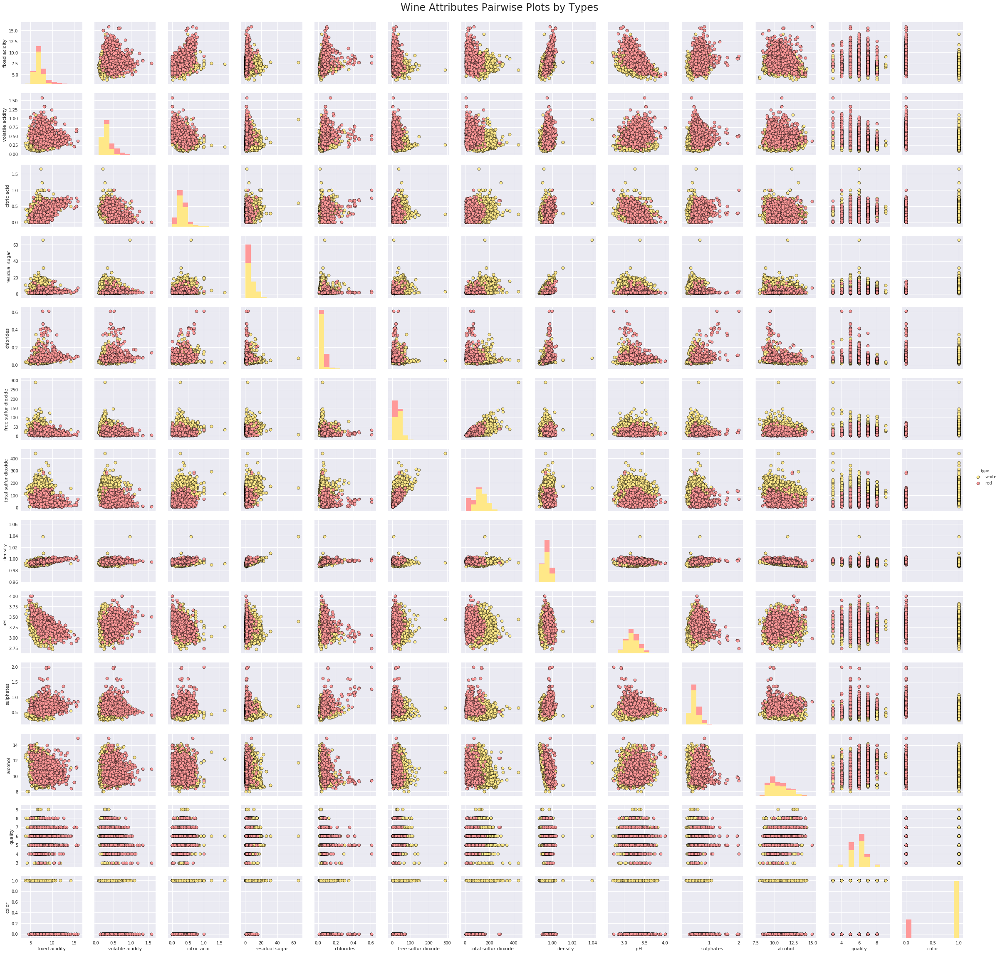

In [17]:
sns.set(font_scale=1.0)
g = sns.pairplot(data = wines, hue='type', palette={'red': '#FF9999', 'white': '#FFE888'},plot_kws=dict(edgecolor='black', linewidth=0.5))
fig = g.fig 
fig.subplots_adjust(top=0.96, wspace=0.2)
t = fig.suptitle('Wine Attributes Pairwise Plots by Types', fontsize=24)

From pair plot above we can notice several interesting patterns, which are in alignment with the insights we obtained earlier at ANOVA test and correlations
- Residual sugar, total sulfur dioxide and citric acid in white wine seems to be much higher than red wine.
- Sulphates, fixed acidity and volatile acidity seem to be higher in red wine as compared to white wine.
- Density has slightly strong negative correlation with  alcohol, which is confirmed by the linear trend of the points from left to right in a decreasing (downward) direction.
- Density has slightly strong positive correlation with residual sugar, which is reinforced by two white wine outliers.

Let's see the correlation and pair plots from the perpective of quality:

#### Check for correlations based on wines quality labels
Now, I will make a zoom in these features in order of their correlation with wine quality labels:

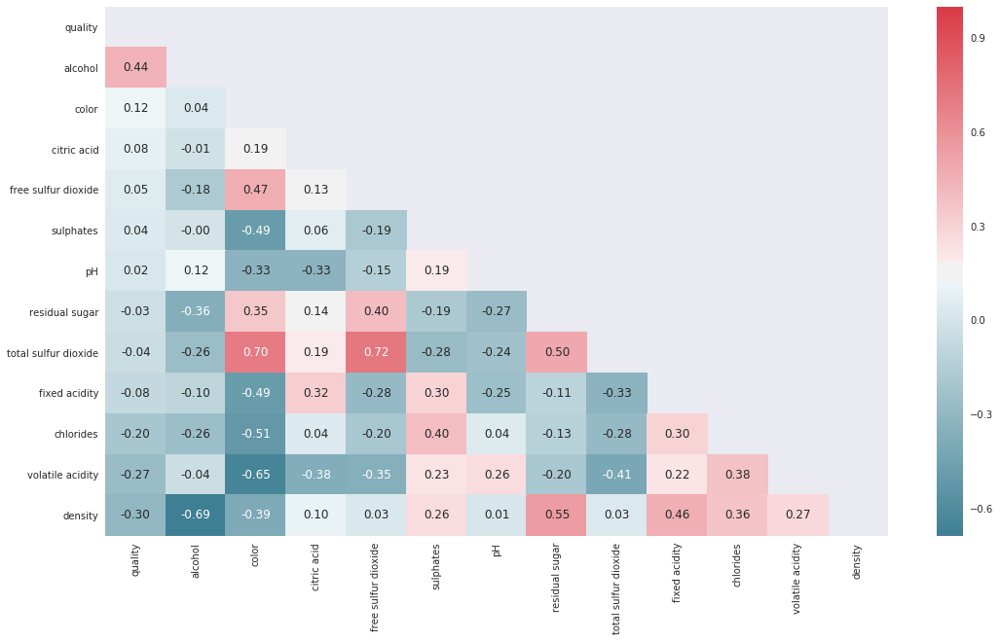

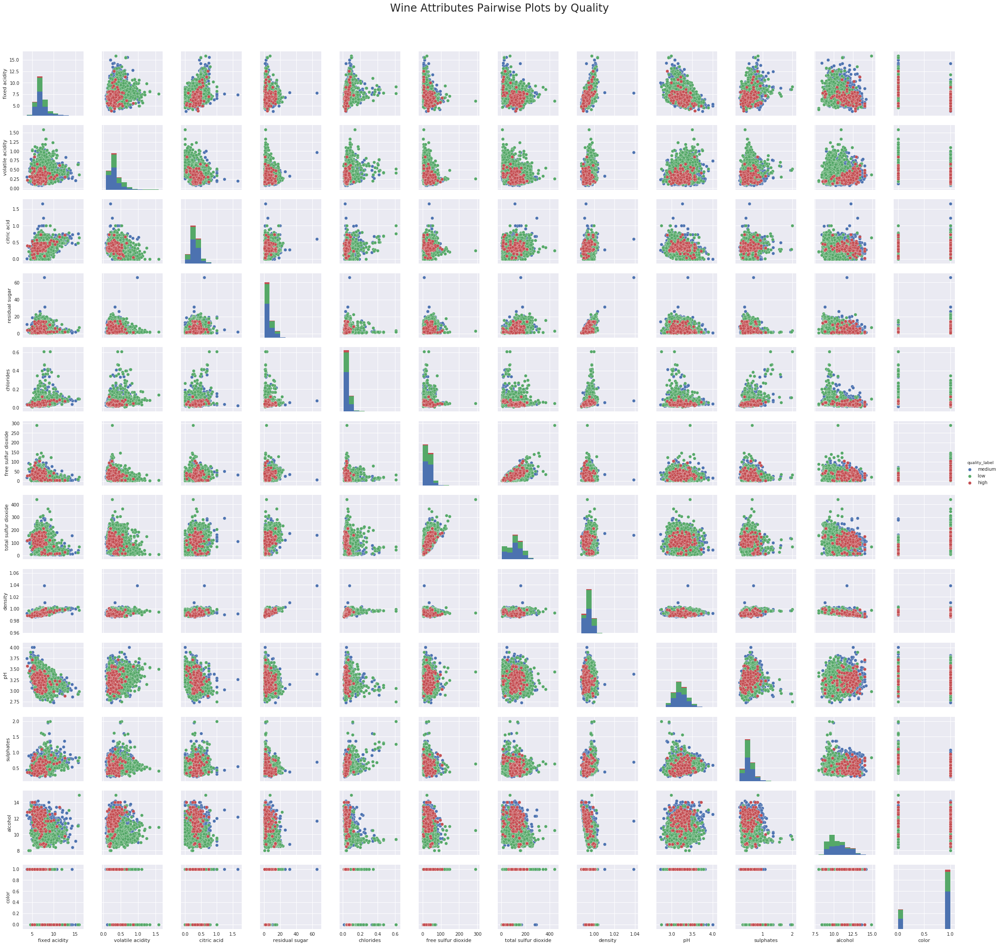

In [18]:
corr = wines.corr()
top_corr_cols = corr.quality.sort_values(ascending=False).keys() 
top_corr = corr.loc[top_corr_cols, top_corr_cols]
dropSelf = np.zeros_like(top_corr)
dropSelf[np.triu_indices_from(dropSelf)] = True
plt.figure(figsize=(18, 10))
sns.heatmap(top_corr, cmap=sns.diverging_palette(220, 10, as_cmap=True), annot=True, fmt=".2f", mask=dropSelf)
sns.set(font_scale=1.5)

sns.set(font_scale=1.0)
cols = wines.columns
cols = cols.drop('quality')
g = sns.pairplot(data = wines.loc[:, cols], hue='quality_label')
fig = g.fig 
fig.subplots_adjust(top=0.93, wspace=0.3)
t = fig.suptitle('Wine Attributes Pairwise Plots by Quality', fontsize=24)

plt.show()

del corr, dropSelf, top_corr, g, fig, t

Again it is in alignment with the insights we obtained earlier at ANOVA test and correlations
- Lower sulphate levels in wines with high quality ratings, but the higest are found in the medium quality
- Lower levels of volatile acids in wines with high quality ratings
- The higest correlation, 0,72, is see between total and free sulfur dioxide, which is expected, but the two measures have low correlation and in opposite directions with the quality,. So, we will treat this if necessary when we check the multicollinearity.

Again it is in alignment with the insights we obtained earlier at ANOVA test and correlations
- Lower sulphate levels in wines with high quality ratings, but the higest are found in the medium quality
- Lower levels of volatile acids in wines with high quality ratings

Let's see the relation of wine quality and their acohol:

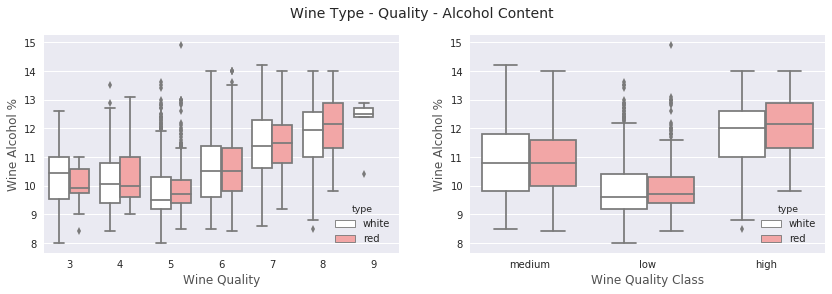

In [19]:
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 4))
f.suptitle('Wine Type - Quality - Alcohol Content', fontsize=14)

sns.boxplot(x='quality', y='alcohol', hue='type', data=wines, palette={"red": "#FF9999", "white": "white"}, ax=ax1)
ax1.set_xlabel("Wine Quality",size = 12,alpha=0.8)
ax1.set_ylabel("Wine Alcohol %",size = 12,alpha=0.8)

sns.boxplot(x='quality_label', y='alcohol', hue='type', data=wines, palette={"red": "#FF9999", "white": "white"}, ax=ax2)
ax2.set_xlabel("Wine Quality Class",size = 12,alpha=0.8)
ax2.set_ylabel("Wine Alcohol %",size = 12,alpha=0.8)
plt.show()

Each box plot above depicts the distribution of alcohol level for a particular wine quality rating separated by wine types.  We can clearly observe the wine alcohol by volume distribution has an increasing trend based on higher quality rated wine samples, and some  outliers in each quality level often depicted by individual points

Let's see visualizing relationships between wine types, quality and acidity:

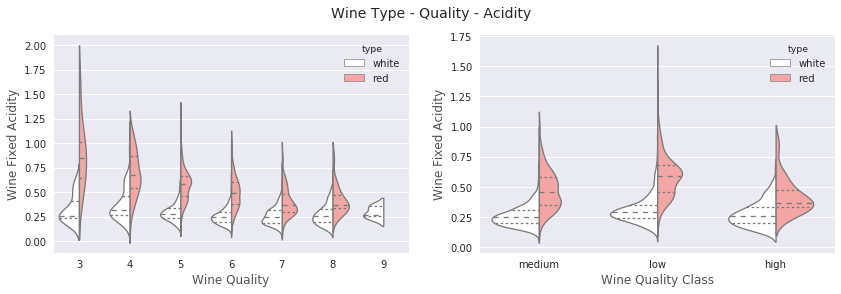

In [20]:
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 4))
f.suptitle('Wine Type - Quality - Acidity', fontsize=14)

sns.violinplot(x='quality', y='volatile acidity', hue='type', data=wines, split=True, inner='quart', linewidth=1.3,
               palette={'red': '#FF9999', 'white': 'white'}, ax=ax1)
ax1.set_xlabel("Wine Quality",size = 12,alpha=0.8)
ax1.set_ylabel("Wine Fixed Acidity",size = 12,alpha=0.8)

sns.violinplot(x='quality_label', y='volatile acidity', hue='type', data=wines, split=True, inner='quart', linewidth=1.3,
               palette={'red': '#FF9999', 'white': 'white'}, ax=ax2)
ax2.set_xlabel("Wine Quality Class",size = 12,alpha=0.8)
ax2.set_ylabel("Wine Fixed Acidity",size = 12,alpha=0.8)
plt.show()

It is quite evident that red wine samples have higher acidity as compared to its white wine counterparts. Also we can see an overall decrease in acidity with higher quality wine for red wine samples but not so much for white wine samples. 

Let's see this obsevation in some 3 variabels graphs analysis:

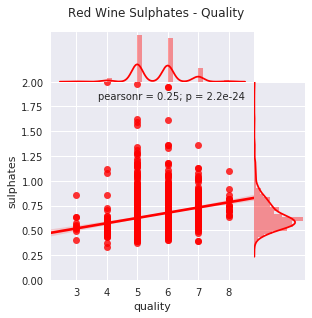

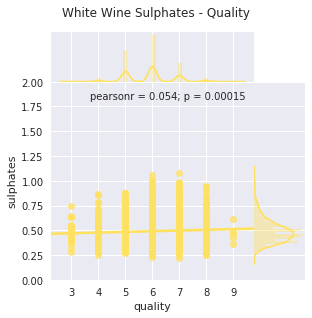

In [21]:
r = sns.jointplot(x='quality', y='sulphates', data=wines[wines.color == 0], # , ax = ax
                  kind='reg', ylim=(0, 2), color='red', space=0, size=4.5, ratio=4)
r.ax_joint.set_xticks(list(range(3,9)))
rfig = r.fig 
rfig.subplots_adjust(top=0.9)
t = rfig.suptitle('Red Wine Sulphates - Quality', fontsize=12)

w = sns.jointplot(x='quality', y='sulphates', data=wines[wines.color == 1],
                   kind='reg', ylim=(0, 2), color='#FFE160', space=0, size=4.5, ratio=4)
w.ax_joint.set_xticks(list(range(3,10)))
wfig = w.fig 
wfig.subplots_adjust(top=0.9)
t = wfig.suptitle('White Wine Sulphates - Quality', fontsize=12)

While there seems to be some pattern depicting a slight higer sulphate levels for higher quality rated wine samples, the correlation is quite weak. However, we do see this tendecy is caused by higer concentartion on medium quality, and a clearly see that sulphate levels for red wine are much higher as compared to the ones in white wine. 

Let's see this obsevation in some 4 variabels graphs analysis:

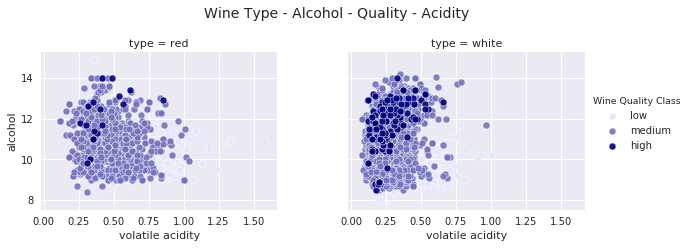

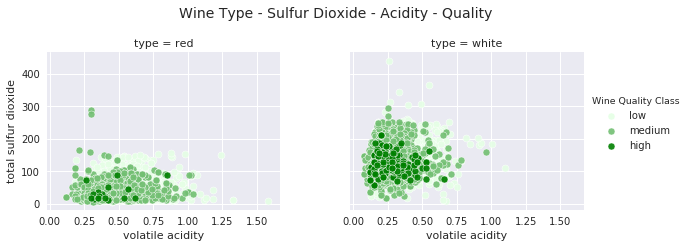

In [22]:
g = sns.FacetGrid(wines, col='type', hue='quality_label', col_order=['red', 'white'], hue_order=['low', 'medium', 'high'],
                  aspect=1.2, size=3.5, palette=sns.light_palette('navy', 3))
g.map(plt.scatter, 'volatile acidity', 'alcohol', alpha=0.9, edgecolor='white', linewidth=0.5)
fig = g.fig
fig.subplots_adjust(top=0.8, wspace=0.3)
fig.suptitle('Wine Type - Alcohol - Quality - Acidity', fontsize=14)
l = g.add_legend(title='Wine Quality Class')

g = sns.FacetGrid(wines, col='type', hue='quality_label', col_order=['red', 'white'], hue_order=['low', 'medium', 'high'],
                  aspect=1.2, size=3.5, palette=sns.light_palette('green', 3))
g.map(plt.scatter, "volatile acidity", "total sulfur dioxide", alpha=0.9, edgecolor='white', linewidth=0.5)
fig = g.fig 
fig.subplots_adjust(top=0.8, wspace=0.3)
fig.suptitle('Wine Type - Sulfur Dioxide - Acidity - Quality', fontsize=14)
l = g.add_legend(title='Wine Quality Class')

From the first pair graphs we can see that hHigher quality wine samples have lower levels of volatile acidity and higher levels of alcohol content as compared to wine samples with medium and low ratings. Besides this, we can also see that volatile acidity levels are slightly lower in white wine samples as compared to red wine samples.

In the second pair graph, the volatile acidity as well as total sulfur dioxide is considerably lower in high quality wine samples. Also, total sulfur dioxide is considerable more in white wine samples as compared to red wine samples. However, volatile acidity levels are slightly lower in white wine samples as compared to red wine samples we also observed in the previous plot.

## Feature Engineering - Cleaning, Transforming, Selection and Reduction
### Box cox transformation of highly skewed features
A Box Cox transformation is a way to transform non-normal data distribution into a normal shape. 

In [23]:
numeric_features = list(wines.dtypes[(wines.dtypes != "str") & (wines.dtypes !='object')].index)
numeric_features.remove('color')

skewed_features = wines[numeric_features].apply(lambda x : skew (x.dropna())).sort_values(ascending=False)

#compute skewness
skewness = pd.DataFrame({'Skew' :skewed_features})   

# Get only higest skewed features
skewness = skewness[abs(skewness) > 0.7]
skewness = skewness.dropna()
print ("There are {} higest skewed numerical features to box cox transform".format(skewness.shape[0]))

l_opt = {}

for feat in skewness.index:
    wines[feat], l_opt[feat] = boxcox((wines[feat]+1))

skewed_features2 = wines[skewness.index].apply(lambda x : skew (x.dropna())).sort_values(ascending=False)

#compute skewness
skewness2 = pd.DataFrame({'New Skew' :skewed_features2})   
display(pd.concat([skewness, skewness2], axis=1).sort_values(by=['Skew'], ascending=False))

There are 6 higest skewed numerical features to box cox transform


,Skew,New Skew
chlorides,5.402178,0.188542
sulphates,1.802523,0.010381
fixed acidity,1.721248,-0.062754
volatile acidity,1.499692,0.113617
residual sugar,1.436792,0.136151
free sulfur dioxide,1.223143,-0.036825


As you can see, we were able at first to bring most the numerical values closer to normal. Maybe you're not satisfied with the results and want to understand if we really need to continue to transform some discrete data. So, let's take a look at the QQ test of these features.

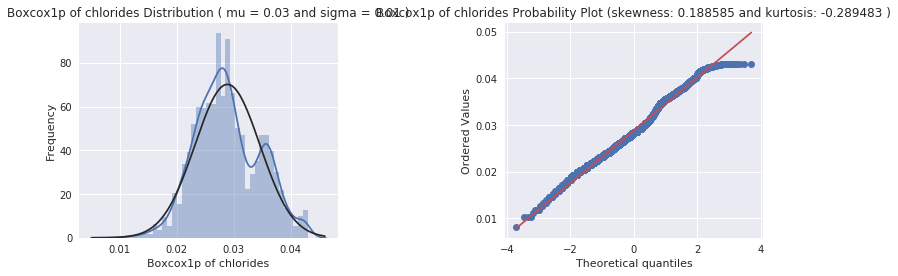

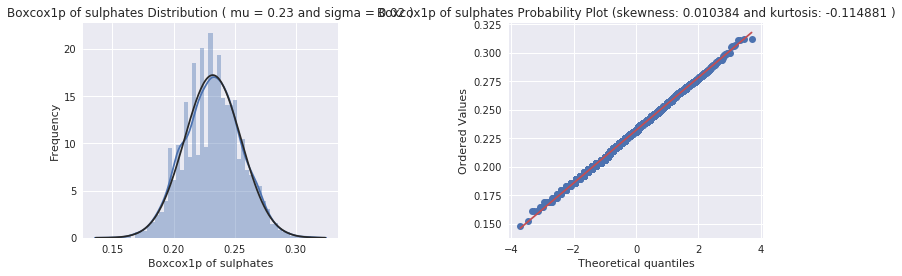

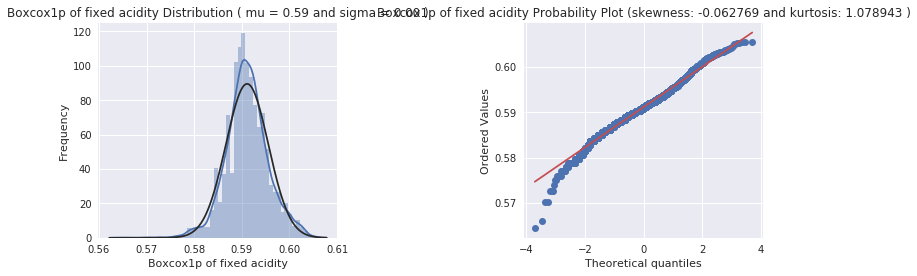

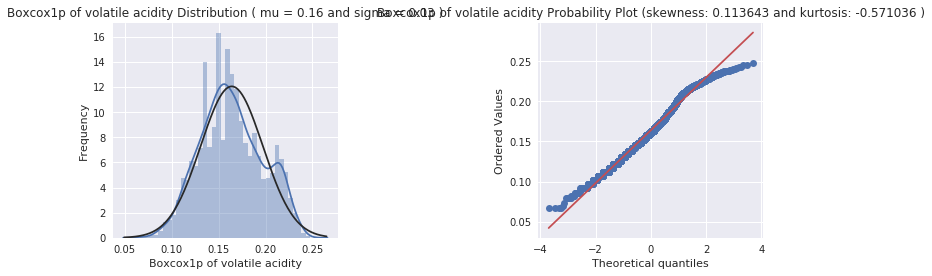

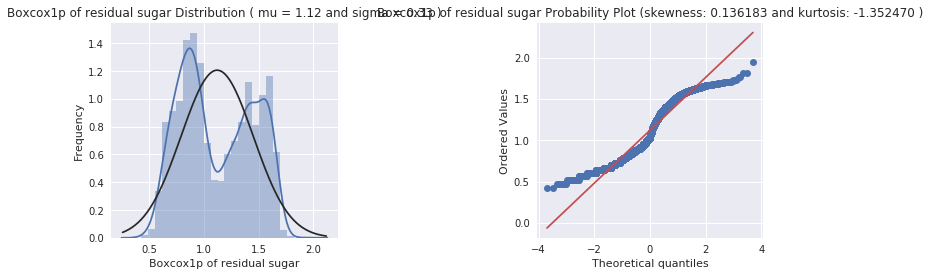

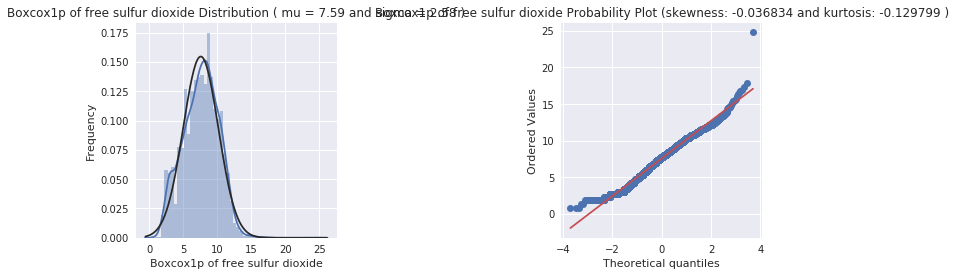

In [24]:
def QQ_plot(data, measure):
    fig = plt.figure(figsize=(12,4))

    #Get the fitted parameters used by the function
    (mu, sigma) = norm.fit(data)

    #Kernel Density plot
    fig1 = fig.add_subplot(121)
    sns.distplot(data, fit=norm)
    fig1.set_title(measure + ' Distribution ( mu = {:.2f} and sigma = {:.2f} )'.format(mu, sigma), loc='center')
    fig1.set_xlabel(measure)
    fig1.set_ylabel('Frequency')

    #QQ plot
    fig2 = fig.add_subplot(122)
    res = probplot(data, plot=fig2)
    fig2.set_title(measure + ' Probability Plot (skewness: {:.6f} and kurtosis: {:.6f} )'.\
                   format(data.skew(), data.kurt()), loc='center')

    plt.tight_layout()
    plt.show()
    
for feat in skewness.index:
    QQ_plot(wines[feat], ('Boxcox1p of {}'.format(feat)))

As you can see, in addition to having presented significant improvements, they also pass the QQ test and present interesting distributions as we can observe in their respective graphs.

So, we can continue to apply the BoxCox on this features.

### Identify  and treat multicollinearity:
**Multicollinearity** is more troublesome to detect because it emerges when three or more variables, which are highly correlated, are included within a model, leading to unreliable and unstable estimates of regression coefficients. To make matters worst multicollinearity can emerge even when isolated pairs of variables are not collinear.


In [25]:
from patsy import dmatrices
from statsmodels.stats.outliers_influence import variance_inflation_factor

def VRF(predict, data, y):
   
    scale = StandardScaler(with_std=False)
    df = pd.DataFrame(scale.fit_transform(data), columns= cols)
    features = "+".join(cols)
    df['quality_label'] = y.values

    # get y and X dataframes based on this regression:
    y, X = dmatrices(predict + ' ~' + features, data = df, return_type='dataframe')

   # Calculate VIF Factors
    # For each X, calculate VIF and save in dataframe
    vif = pd.DataFrame()
    vif["VIF Factor"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
    vif["features"] = X.columns

    # Inspect VIF Factors
    display(vif.sort_values('VIF Factor'))
    return vif

cols = wines.columns.str.replace(' ', '_')
df = wines.copy()
df.columns = cols
# Remove the not applied to the qualty classification task
cols = list(cols.drop(['type', 'quality_label', 'quality']))

vif = VRF('quality_label', df.loc[:, cols], y_ql)

,VIF Factor,features
0,1.000000,Intercept
3,1.456483,citric_acid
10,1.459199,sulphates
2,1.913981,volatile_acidity
9,1.922427,pH
6,2.496617,free_sulfur_dioxide
5,2.561999,chlorides
1,2.726160,fixed_acidity
11,3.658381,alcohol
4,3.811469,residual_sugar


Let's remove the residual suagar and total sulfur dioxide

In [26]:
cols = wines.columns.str.replace(' ', '_')
df = wines.copy()
df.columns = cols
# Remove the higest correlations and run a multiple regression
cols = list(cols.drop(['type', 'quality_label', 'quality', 'residual_sugar', 'total_sulfur_dioxide']))

vif = VRF('quality_label', df.loc[:, cols], y_ql)

del df, vif

,VIF Factor,features
0,1.000000,Intercept
8,1.402620,sulphates
3,1.433664,citric_acid
5,1.532415,free_sulfur_dioxide
7,1.658454,pH
2,1.809226,volatile_acidity
1,2.254045,fixed_acidity
4,2.512481,chlorides
9,2.649799,alcohol
6,3.314295,density


### Feature Selection into the Pipeline
Since we have a few features it may be enough only the removal of collinear and multicollinear. However, with collinearity and multicollinearity levels are low and there are models to handle this. Then, it is interesting that we proceed with the selection of variables within the pipeline, allowing us to decide if there will be selection of variables and by which method. We can still improve the results through hyper parameterization and cross-validation.
![image](https://thumbs.gfycat.com/HonestThinCrocodileskink-small.gif)

In [27]:
class select_fetaures(object): # BaseEstimator, TransformerMixin, 
    def __init__(self, select_cols):
        self.select_cols_ = select_cols
    
    def fit(self, X, Y ):
        pass

    def transform(self, X):
        return X.loc[:, self.select_cols_]    

    def fit_transform(self, X, Y):
        self.fit(X, Y)
        df = self.transform(X)
        return df    

    def __getitem__(self, x):
        return self.X[x], self.Y[x]

### Dimensionality Reduction

**Principal component analysis** ([PCA](http://scikit-learn.org/stable/modules/generated/sklearn.decomposition.PCA.html)) is a statistical procedure that uses an orthogonal transformation to convert a set of observations of possibly correlated variables into a set of values of linearly uncorrelated variables called principal components. If there are n observations with p variables, then the number of distinct principal components is `min(n-1,p)`. This transformation is defined in such a way that the first principal component has the largest possible variance, and each succeeding component in turn has the highest variance possible under the constraint that it is orthogonal to the preceding components. The resulting vectors are an uncorrelated orthogonal basis set. PCA is sensitive to the relative scaling of the original variables.


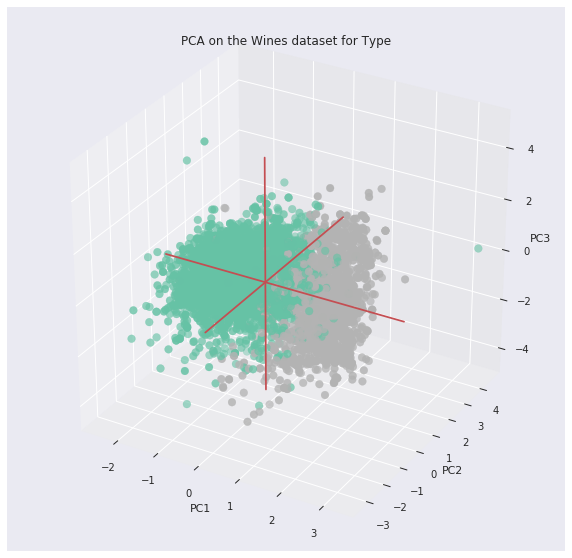

KNeighbors Classifier Training Accuracy: 99.98%
KNeighbors Classifier Test Accuracy: 99.33%
________________________________________

Accurance on Type  Prediction By Number of PCA COmponents:



,Var_ratio,Train_Acc,Test_Acc
Components,,,
11,99.427453,0.999779,0.993811
10,97.667786,0.999779,0.993296
8,91.839268,0.999779,0.991748
9,95.160591,0.999779,0.990717
6,82.997327,0.999779,0.989170
7,87.723789,0.999779,0.989170
4,70.692560,0.999779,0.988138
5,77.709477,0.999779,0.987622
3,61.525142,0.999779,0.985560


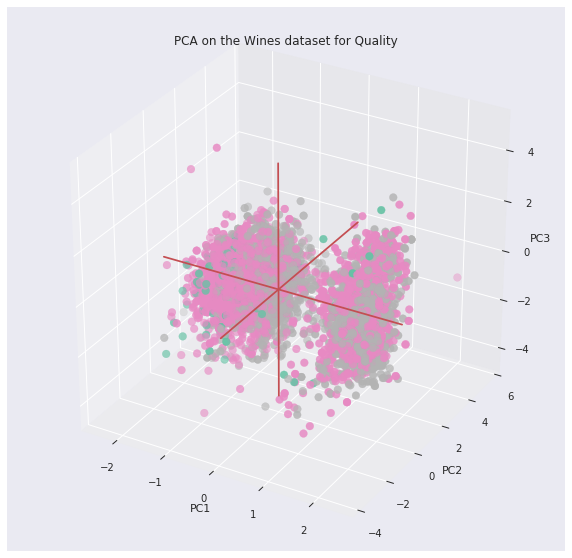

KNeighbors Classifier Training Accuracy: 100.00%
KNeighbors Classifier Test Accuracy: 78.29%
________________________________________

Accurance on Quality  Prediction By Number of PCA COmponents:



,Var_ratio,Train_Acc,Test_Acc
Components,,,
10,98.577969,1.0,0.784425
11,99.485315,1.0,0.782878
6,85.704486,1.0,0.777205
9,96.547242,1.0,0.773079
8,93.557958,1.0,0.768437
5,80.594934,1.0,0.767922
7,90.053091,1.0,0.764827
4,74.622660,1.0,0.755028
3,66.550688,1.0,0.733368


In [28]:
def pca_analysis(df, y_train, feat):
    scale = StandardScaler()
    df = pd.DataFrame(scale.fit_transform(df), index=df.index)
    pca_all = PCA(random_state=101, whiten=True).fit(df)

    my_color=y_train

    # Store results of PCA in a data frame
    result=pd.DataFrame(pca_all.transform(df), columns=['PCA%i' % i for i in range(df.shape[1])], index=df.index)

    # Plot initialisation
    fig = plt.figure(figsize=(10,10))
    ax = fig.add_subplot(111, projection='3d')
    ax.scatter(result['PCA0'], result['PCA1'], result['PCA2'], c=my_color, cmap="Set2_r", s=60)

    # make simple, bare axis lines through space:
    xAxisLine = ((min(result['PCA0']), max(result['PCA0'])), (0, 0), (0,0))
    ax.plot(xAxisLine[0], xAxisLine[1], xAxisLine[2], 'r')
    yAxisLine = ((0, 0), (min(result['PCA1']), max(result['PCA1'])), (0,0))
    ax.plot(yAxisLine[0], yAxisLine[1], yAxisLine[2], 'r')
    zAxisLine = ((0, 0), (0,0), (min(result['PCA2']), max(result['PCA2'])))
    ax.plot(zAxisLine[0], zAxisLine[1], zAxisLine[2], 'r')

    # label the axes
    ax.set_xlabel("PC1")
    ax.set_ylabel("PC2")
    ax.set_zlabel("PC3")
    ax.set_title("PCA on the Wines dataset for " + (feat))
    plt.show()

    X_train , X_test, y, y_test = train_test_split(df , y_train, test_size=0.3, random_state=0)

    KNC = KNeighborsClassifier(algorithm = 'ball_tree', leaf_size = 12, n_neighbors = 12, p  = 1, weights = 'distance')
    KNC = KNC.fit(X_train, y)
    print('KNeighbors Classifier Training Accuracy: {:2.2%}'.format(accuracy_score(y, KNC.predict(X_train))))
    y_pred = KNC.predict(X_test)
    print('KNeighbors Classifier Test Accuracy: {:2.2%}'.format(accuracy_score(y_test, y_pred)))

    print('_' * 40)
    print('\nAccurance on', feat, ' Prediction By Number of PCA COmponents:\n')
    AccPca = pd.DataFrame(columns=['Components', 'Var_ratio', 'Train_Acc', 'Test_Acc'])

    for componets in np.arange(1, df.shape[1]):
        variance_ratio = sum(pca_all.explained_variance_ratio_[:componets])*100
        pca = PCA(n_components=componets, random_state=101, whiten=True)
        X_train_pca = pca.fit_transform(X_train)
        Components = X_train_pca.shape[1]
        KNC = KNeighborsClassifier(algorithm = 'ball_tree', leaf_size = 12, n_neighbors = 12, p  = 1, weights = 'distance')
        KNC = KNC.fit(X_train_pca, y)
        Training_Accuracy = accuracy_score(y, KNC.predict(X_train_pca))
        X_test_pca = pca.transform(X_test)
        y_pred = KNC.predict(X_test_pca)
        Test_Accuracy = accuracy_score(y_test, y_pred)
        AccPca = AccPca.append(pd.DataFrame([(Components, variance_ratio, Training_Accuracy, Test_Accuracy)],
                                            columns=['Components', 'Var_ratio', 'Train_Acc', 'Test_Acc']))#], axis=0)

    AccPca.set_index('Components', inplace=True)
    display(AccPca.sort_values(by='Test_Acc', ascending=False))

cols = wines.columns
cols = list(cols.drop(['type', 'quality_label', 'color']))
pca_analysis(wines.loc[:, cols], y_tp, 'Type')

cols = wines.columns
cols = list(cols.drop(['type', 'quality_label', 'quality']))
pca_analysis(wines.loc[:, cols], y_ql, 'Quality')

#### Linear Discriminant Analysis (LDA)

As a supervised dimensionality reduction technique for maximizing class separability. LDA can be used as a technique for feature extraction to increase the computational efficiency and reduce the degree of over-fitting due to the curse of dimensionality in nonregularized models. 

So, the goal is to find the feature subspace that optimizes class separability.

However, even if one or more of those assumptions are slightly violated, LDA for dimensionality reduction can still work reasonably well.


**Some Important Parameters:**
solver : string, optional
    Solver to use, possible values:
      - svd: Singular value decomposition (default).
        Does not compute the covariance matrix, therefore this solver is
        recommended for data with a large number of features.
      - eigen: Eigenvalue decomposition, can be combined with shrinkage.

shrinkage : string or float, optional
    Shrinkage parameter, possible values:
      - None: no shrinkage (default).
      - auto: automatic shrinkage using the Ledoit-Wolf lemma.
      - float between 0 and 1: fixed shrinkage parameter.

    Note that shrinkage works only with 'lsqr' and 'eigen' solvers.

KNC Training Accuracy: 99.98%
KNC Test Accuracy: 96.29%
________________________________________

Apply LDA:

Number of features after LDA: 1
LR Training Accuracy With LDA: 99.98%
LR Test Accuracy With LDA: 99.33%


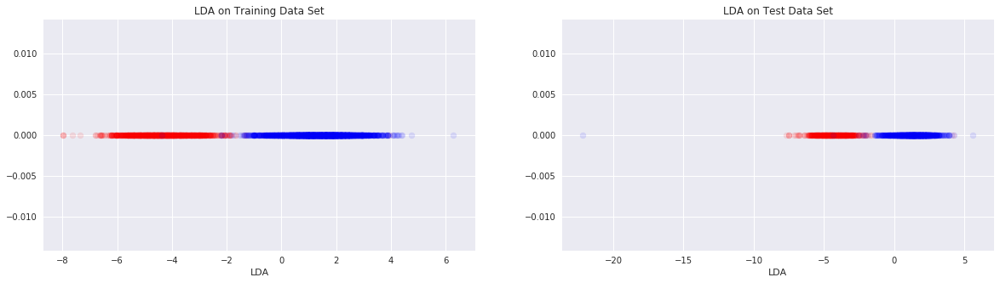

KNC Training Accuracy: 100.00%
KNC Test Accuracy: 73.70%
________________________________________

Apply LDA:

Number of features after LDA: 2
LR Training Accuracy With LDA: 100.00%
LR Test Accuracy With LDA: 76.95%


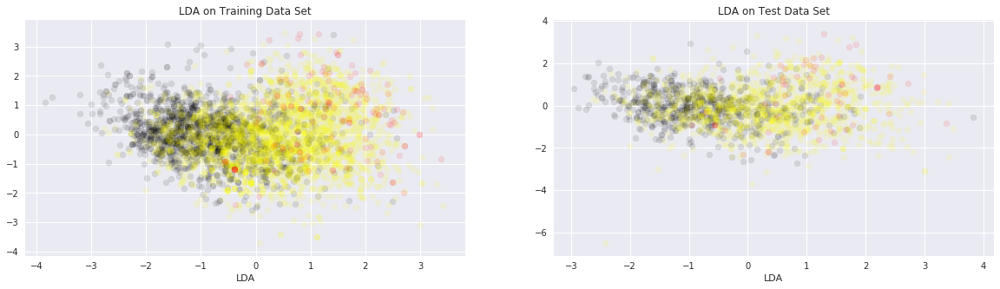

In [29]:
def LDA_analysis(df, y_train, feat):
    X_train , X_test, y, y_test = train_test_split(df , y_train, test_size=0.3, random_state=0)

    KNC = KNeighborsClassifier(algorithm = 'ball_tree', leaf_size = 12, n_neighbors = 12, p  = 1, weights = 'distance')
    KNC = KNC.fit(X_train, y)
    print('KNC Training Accuracy: {:2.2%}'.format(accuracy_score(y, KNC.predict(X_train))))
    y_pred = KNC.predict(X_test)
    print('KNC Test Accuracy: {:2.2%}'.format(accuracy_score(y_test, y_pred)))
    print('_' * 40)
    print('\nApply LDA:\n')
    lda = LDA(n_components=2, store_covariance=True)
    X_train_lda = lda.fit_transform(X_train, y)
    #X_train_lda = pd.DataFrame(X_train_lda)

    print('Number of features after LDA:',X_train_lda.shape[1])
    KNC = KNeighborsClassifier(algorithm = 'ball_tree', leaf_size = 12, n_neighbors = 12, p  = 1, weights = 'distance')
    KNCr = KNC.fit(X_train_lda, y)
    print('LR Training Accuracy With LDA: {:2.2%}'.format(accuracy_score(y, KNC.predict(X_train_lda))))
    X_test_lda = lda.transform(X_test)
    y_pred = KNC.predict(X_test_lda)
    print('LR Test Accuracy With LDA: {:2.2%}'.format(accuracy_score(y_test, y_pred)))

    if X_train_lda.shape[1]==1:
        fig = plt.figure(figsize=(20,5))
        fig.add_subplot(121)
        plt.scatter(X_train_lda[y==0, 0], np.zeros((len(X_train_lda[y==0, 0]),1)), color='red', alpha=0.1)
        plt.scatter(X_train_lda[y==1, 0], np.zeros((len(X_train_lda[y==1, 0]),1)), color='blue', alpha=0.1)
        plt.title('LDA on Training Data Set')
        plt.xlabel('LDA')
        fig.add_subplot(122)
        plt.scatter(X_test_lda[y_test==0, 0], np.zeros((len(X_test_lda[y_test==0, 0]),1)), color='red', alpha=0.1)
        plt.scatter(X_test_lda[y_test==1, 0], np.zeros((len(X_test_lda[y_test==1, 0]),1)), color='blue', alpha=0.1)
        plt.title('LDA on Test Data Set')
        plt.xlabel('LDA')
    else:
        fig = plt.figure(figsize=(20,5))
        fig.add_subplot(121)
        plt.scatter(X_train_lda[y==0, 0], X_train_lda[y==0, 1], color='black', alpha=0.1)
        plt.scatter(X_train_lda[y==1, 0], X_train_lda[y==1, 1], color='yellow', alpha=0.1)
        plt.scatter(X_train_lda[y==2, 0], X_train_lda[y==2, 1], color='red', alpha=0.1)
        plt.title('LDA on Training Data Set')
        plt.xlabel('LDA')
        fig.add_subplot(122)
        plt.scatter(X_test_lda[y_test==0, 0], X_test_lda[y_test==0, 1], color='black', alpha=0.1)
        plt.scatter(X_test_lda[y_test==1, 0], X_test_lda[y_test==1, 1], color='yellow', alpha=0.1)
        plt.scatter(X_test_lda[y_test==2, 0], X_test_lda[y_test==2, 1], color='red', alpha=0.1)
        plt.title('LDA on Test Data Set')
        plt.xlabel('LDA')

    plt.show()
    
cols = wines.columns
cols = list(cols.drop(['type', 'quality_label', 'color']))
LDA_analysis(wines.loc[:, cols], y_tp, 'Type')

cols = wines.columns
cols = list(cols.drop(['type', 'quality_label', 'quality']))
LDA_analysis(wines.loc[:, cols], y_ql, 'Quality')

In [40]:
from sklearn.metrics import accuracy_score, roc_auc_score, roc_curve, auc
from sklearn import metrics
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import label_binarize
from scipy import interp

def get_results(model, name, data, true_labels, target_names=['red', 'white'], results=None, reasume=False):

    if hasattr(model, 'layers'):
        param = wtp_dnn_model.history.params
        best = np.mean(wtp_dnn_model.history.history['val_acc'])
        predicted_labels = model.predict_classes(data)
    else:
        param = gs.best_params_
        best = gs.best_score_
        predicted_labels = model.predict(data).ravel()

    print('Mean Best Accuracy: {:2.2%}'.format(best))
    print('-'*60)
    print('Best Parameters:')
    print(param)
    print('-'*60)
    
    y_pred = model.predict(data).ravel()
    
    display_model_performance_metrics(true_labels, predicted_labels=predicted_labels, target_names=target_names)
    if len(target_names) == 2:
        ras = roc_auc_score(y_true=true_labels, y_score=y_pred)
    else:
        roc_auc_multiclass, ras = roc_auc_score_multiclass(y_true=true_labels, y_score=y_pred, target_names=target_names)
        print('\nROC AUC Score by Classes:\n', roc_auc_multiclass)
        print('-'*60)

    print('\n\n              ROC AUC Score: {:2.2%}'.format(ras))
    prob, score_roc, roc_auc = plot_model_roc_curve(model, data, true_labels, label_encoder=None, class_names=target_names)
    
    r1 = pd.DataFrame([(prob, best, np.round(accuracy_score(true_labels, predicted_labels), 4), 
                         ras, roc_auc)], index=[name],
                         columns=['Prob', 'CV Accuracy', 'Accuracy', 'ROC AUC Score', 'ROC Area'])
    if reasume:
        results = r1
    elif (name in results.index):        
        results.loc[[name], :] = r1
    else: 
        results = results.append(r1)
        
    return results

def roc_auc_score_multiclass(y_true, y_score, target_names, average="macro"):
    unique_class = set(y_true)
    roc_auc_dict = {}
    mean_roc_auc = 0
    for per_class in unique_class:
        other_class = [x for x in unique_class if x != per_class]
        new_y_true = [0 if x in other_class else 1 for x in y_true]
        new_y_score = [0 if x in other_class else 1 for x in y_score]
        num_new_y_true = sum(new_y_true)
        roc_auc = roc_auc_score(new_y_true, new_y_score, average=average)
        roc_auc_dict[target_names[per_class]] = np.round(roc_auc, 4)
        mean_roc_auc += num_new_y_true * np.round(roc_auc, 4)
    
    mean_roc_auc = mean_roc_auc / len(y_true)  
    return roc_auc_dict, mean_roc_auc

def get_metrics(true_labels, predicted_labels):
    print('Accuracy:  {:2.2%} '.format(metrics.accuracy_score(true_labels, predicted_labels)))
    print('Precision: {:2.2%} '.format(metrics.precision_score(true_labels, predicted_labels, average='weighted')))
    print('Recall:    {:2.2%} '.format(metrics.recall_score(true_labels, predicted_labels, average='weighted')))
    print('F1 Score:  {:2.2%} '.format(metrics.f1_score(true_labels, predicted_labels, average='weighted')))

def train_predict_model(classifier, train_features, train_labels, test_features, test_labels):
    classifier.fit(train_features, train_labels)
    predictions = classifier.predict(test_features) 
    return predictions    

def display_confusion_matrix(true_labels, predicted_labels, target_names):
    total_classes = len(target_names)
    level_labels = [total_classes * [0], list(range(total_classes))]
    cm = metrics.confusion_matrix(y_true=true_labels, y_pred=predicted_labels)
    cm_frame = pd.DataFrame(data=cm, 
                            columns=pd.MultiIndex(levels=[['Predicted:'], target_names], labels=level_labels), 
                            index=pd.MultiIndex(levels=[['Actual:'], target_names], labels=level_labels)) 
    print(cm_frame) 

def display_classification_report(true_labels, predicted_labels, target_names):
    report = metrics.classification_report(y_true=true_labels, y_pred=predicted_labels, target_names=target_names) 
    print(report)
    
def display_model_performance_metrics(true_labels, predicted_labels, target_names):
    print('Model Performance metrics:')
    print('-'*30)
    get_metrics(true_labels=true_labels, predicted_labels=predicted_labels)
    print('\nModel Classification report:')
    print('-'*30)
    display_classification_report(true_labels=true_labels, predicted_labels=predicted_labels, target_names=target_names)
    print('\nPrediction Confusion Matrix:')
    print('-'*30)
    display_confusion_matrix(true_labels=true_labels, predicted_labels=predicted_labels, target_names=target_names)

def plot_model_roc_curve(clf, features, true_labels, label_encoder=None, class_names=None):
    fpr = dict()
    tpr = dict()
    roc_auc = dict()
    if hasattr(clf, 'classes_'):
        class_labels = clf.classes_
    elif label_encoder:
        class_labels = label_encoder.classes_
    elif class_names:
        class_labels = class_names
    else:
        raise ValueError('Unable to derive prediction classes, please specify class_names!')
    n_classes = len(class_labels)
   
    if n_classes == 2:
        if hasattr(clf, 'predict_proba'):
            prb = clf.predict_proba(features)
            if prb.shape[1] > 1:
                y_score = prb[:, prb.shape[1]-1] 
            else:
                y_score = clf.predict(features).ravel()
            prob = True
        elif hasattr(clf, 'decision_function'):
            y_score = clf.decision_function(features)
            prob = False
        else:
            raise AttributeError("Estimator doesn't have a probability or confidence scoring system!")
        
        fpr, tpr, _ = roc_curve(true_labels, y_score)      
        roc_auc = auc(fpr, tpr)

        plt.plot(fpr, tpr, label='ROC curve (area = {0:3.2%})'.format(roc_auc), linewidth=2.5)
        
    elif n_classes > 2:
        if hasattr(clf, 'clfs_'):
            y_labels = label_binarize(true_labels, classes=list(range(len(class_labels))))
        else:
            y_labels = label_binarize(true_labels, classes=class_labels)
        if hasattr(clf, 'predict_proba'):
            y_score = clf.predict_proba(features)
            prob = True
        elif hasattr(clf, 'decision_function'):
            y_score = clf.decision_function(features)
            prob = False
        else:
            raise AttributeError("Estimator doesn't have a probability or confidence scoring system!")
            
        for i in range(n_classes):
            fpr[i], tpr[i], _ = roc_curve(y_labels[:, i], y_score[:, i])
            roc_auc[i] = auc(fpr[i], tpr[i])

        fpr["micro"], tpr["micro"], _ = roc_curve(y_labels.ravel(), y_score.ravel())
        roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])

        all_fpr = np.unique(np.concatenate([fpr[i] for i in range(n_classes)]))
        mean_tpr = np.zeros_like(all_fpr)
        for i in range(n_classes):
            mean_tpr += interp(all_fpr, fpr[i], tpr[i])
        mean_tpr /= n_classes
        fpr["macro"] = all_fpr
        tpr["macro"] = mean_tpr
        roc_auc["macro"] = auc(fpr["macro"], tpr["macro"])

        plt.figure(figsize=(6, 4))
        plt.plot(fpr["micro"], tpr["micro"], label='micro-average ROC curve (area = {0:2.2%})'
                       ''.format(roc_auc["micro"]), linewidth=3)

        plt.plot(fpr["macro"], tpr["macro"], label='macro-average ROC curve (area = {0:2.2%})'
                       ''.format(roc_auc["macro"]), linewidth=3)

        for i, label in enumerate(class_names):
            plt.plot(fpr[i], tpr[i], label='ROC curve of class {0} (area = {1:2.2%})'
                                           ''.format(label, roc_auc[i]), linewidth=2, linestyle=':')
        roc_auc = roc_auc["macro"]   
    else:
        raise ValueError('Number of classes should be at least 2 or more')
        
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlim([-0.01, 1.0])
    plt.ylim([0.0, 1.01])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic (ROC) Curve')
    plt.legend(loc="lower right")
    plt.show()
    
    return prob, y_score, roc_auc

## Modeling
We start to looking at different approaches to implement classifiers models, and use hyper parametrization, cross validation and compare the results between different errors measures.

First we will make some support functions help us evaluate ours models through a standard. Next, we proceed with the classifications of wines types and next of wines quality labels. We will finalize our quality classification model with a staking approach.

### Simplify Get Results
Let's build a function to standardize the capture and exposure of the results of our models, that stander the reports to:
- The mean best accuracy and best parameters got through the grid  search CV 
- The model performance metrics Accuracy, Precision, Recall and F1 Score
- The model Classification scores by classes 
- The prediction confusion matrix
- The ROC AUC Score and the ROC Curve
- Features importance plot

For the multiclassification cases, like wine quality, you would need to binarize the output to correct claculate the ROC AUC score and ROC Area. Once this operation is executed, you can plot one ROC curve per class label. Besides this, you can also follow two aggregation metrics for computing the average ROC measures.  Micro-averaging involves plotting an ROC curve over the entire prediction space by considering each predicted element as a binary prediction. Macro-averaging involves giving equal weight to each class label when averaging. 

### Hyper Parametrization
Hyperparameters are also known as meta-parameters and are usually set before we start the model training process. These hyperparameters do not have any dependency on being derived from the underlying data on which the model is trained. Usually these hyperparameters represent some high level concepts or knobs, which can be used to tweak and tune the model during training to improve its performance. 

So, let's start with the wine type classifier models.

### Wine Type Classifier Models:
We will start with try classify the wines by red or white. 

Let's prepare our data with focus on type of wines and make the split of training and test datasets to use in the following tasks.

In [41]:
cols = wines.columns
cols = list(cols.drop(['type', 'quality_label', 'color']))
X_train, X_test, y_train, y_test = train_test_split(wines.loc[:, cols], y_tp, test_size=0.20, random_state=101)

#### Logistic Regression
Since it is a binary classification task, we try first with a simple logistic regression.

This class implements regularized [logistic regression](http://scikit-learn.org/stable/modules/generated/sklearn.linear_model.LogisticRegression.html) using the 'liblinear' library, 'newton-cg', 'sag' and 'lbfgs' solvers. It can handle both dense and sparse input. 

**Main Parameters**
 - class_weight : dict or 'balanced', default: None
   The "balanced" mode uses the values of y to automatically adjust weights inversely proportional to class frequencies in the input data as ``n_samples / (n_classes * np.bincount(y))``.

   For how class_weight works: It penalizes mistakes in samples of class[i] with class_weight[i] instead of 1. So higher class-weight means you want to put more emphasis on a class. For example, our class 0 is 1.24 times more frequent than class 1. So you should increase the class_weight of class 1 relative to class 0, say {1: 0.6, 0: 0.4}. If the class_weight doesn't sum to 1, it will basically change the regularization parameter.

   "balanced" basically means replicating the smaller class until you have as many samples as in the larger one, but in an implicit way.
   

 - warm_start : bool, default: False. Useless for liblinear solver.
 - ``'clf__multi_class' : ['ovr', 'multinomial']`` for ``'clf__solver': ['newton-cg', 'sag', 'lbfgs']``

**Attributes:**
 - coef_ : array, shape (1, n_features) or (n_classes, n_features)
 - intercept_ : array, shape (1,) or (n_classes,)
 - n_iter_ : array, shape (n_classes,) or (1, )

**See also:**
 - SGDClassifier : incrementally trained logistic regression (when given the parameter ``loss="log"``).
 - sklearn.svm.LinearSVC : learns SVM models using the same algorithm.
 
 See our the best results below with first model from a pipeline with grid search CV.

Fitting 5 folds for each of 456 candidates, totalling 2280 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:    6.5s
[Parallel(n_jobs=-1)]: Done 192 tasks      | elapsed:   13.1s
[Parallel(n_jobs=-1)]: Done 626 tasks      | elapsed:   30.5s
[Parallel(n_jobs=-1)]: Done 1326 tasks      | elapsed:   58.5s
[Parallel(n_jobs=-1)]: Done 2226 tasks      | elapsed:  1.6min
[Parallel(n_jobs=-1)]: Done 2280 out of 2280 | elapsed:  1.6min finished


Mean Best Accuracy: 99.52%
------------------------------------------------------------
Best Parameters:
{'clf__C': 0.003, 'clf__class_weight': 'balanced', 'clf__max_iter': 3, 'clf__penalty': 'l2', 'clf__solver': 'sag', 'clf__tol': 0.001, 'pca__n_components': 12, 'pca__whiten': True}
------------------------------------------------------------
Model Performance metrics:
------------------------------
Accuracy:  99.38% 
Precision: 99.38% 
Recall:    99.38% 
F1 Score:  99.38% 

Model Classification report:
------------------------------
              precision    recall  f1-score   support

         red       0.98      0.99      0.99       327
       white       1.00      0.99      1.00       966

   micro avg       0.99      0.99      0.99      1293
   macro avg       0.99      0.99      0.99      1293
weighted avg       0.99      0.99      0.99      1293


Prediction Confusion Matrix:
------------------------------
              Predicted:      
                     red white
Actual: r

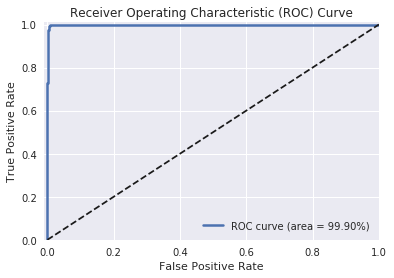

In [42]:
clf = Pipeline([
    ('pca', PCA(random_state=101)),
    ('clf', LogisticRegression(random_state=101))
])  

n_components = [10, 12]
whiten = [True]
C = [0.003, 0.009, 0.01]
tol = [0.001, 0.0001]

param_grid = [
    {'clf__C': C,
     'clf__solver': ['liblinear', 'saga'],
     'clf__penalty': ['l1', 'l2'],
     'clf__tol': tol,
     'clf__class_weight': [None, 'balanced'],
     'pca__n_components': n_components,
     'pca__whiten': whiten},
    {'clf__C': C,
     'clf__max_iter': [3, 9, 2, 7, 4],
     'clf__solver': ['newton-cg', 'sag', 'lbfgs'],
     'clf__penalty': ['l2'],
     'clf__tol': tol,
     'clf__class_weight': [None, 'balanced'],
     'pca__n_components': n_components,
     'pca__whiten': whiten}
]

gs = GridSearchCV(estimator=clf, param_grid=param_grid, scoring='accuracy', cv=5, verbose=1, n_jobs=-1)
LR = Pipeline([
    ('scl', StandardScaler()),
    ('gs', gs)
]) 

LR.fit(X_train, y_train)

results = get_results(LR, 'LogisticRegression', X_test, y_test, reasume=True)

As you can see, we got wonderful with 99.38 in all metrics performance and 99.28% of ROC AUC score. The most important features are total sulfur dioxide, density, chlorides and volatile acidity.

These results are really sufficient and obtained through a very simple model, but out of curiosity, we will submit the same data to a Deep Neural Network Classifier

#### Deep Neural Network

The most simple neural network is the "perceptron", which, in its simplest form, consists of a single neuron. The perceptrons only work with numerical data, so, you should convert any nominal data into a numerical format.

The the perceptron has a important limitation, it could only represent linear separations between classes. To overcome this we can use the multi-layer perceptron overcomes that can be represent more complex decision boundaries.

Multi-layer perceptrons are also known as "feed-forward neural networks". These are more complex networks as they consist of multiple neurons that are organized in layers. The number of layers is usually limited to two or three, but theoretically, there is no limit!

Among the layers, you can distinguish an input layer, hidden layers and an output layer. Multi-layer perceptrons are often fully connected. This means that there's a connection from each perceptron in a certain layer to each perceptron in the next layer. Even though the connectedness is no requirement, this is typically the case.

One of the most powerful and easy-to-use Python libraries for developing and evaluating deep learning models is [Keras](https://keras.io/models/sequential/). It wraps the efficient numerical computation libraries Theano and TensorFlow. The advantage of this is mainly that you can get started with neural networks in an easy and fun way. A quick way to get started is to use the Keras Sequential model: it's a linear stack of layers. You can easily create the model by passing a list of layer instances to the constructor, which you set up by running `model = Sequential()`.

So, let's go and create our DNN classifier of type wines in  Keras with TensorFlow:

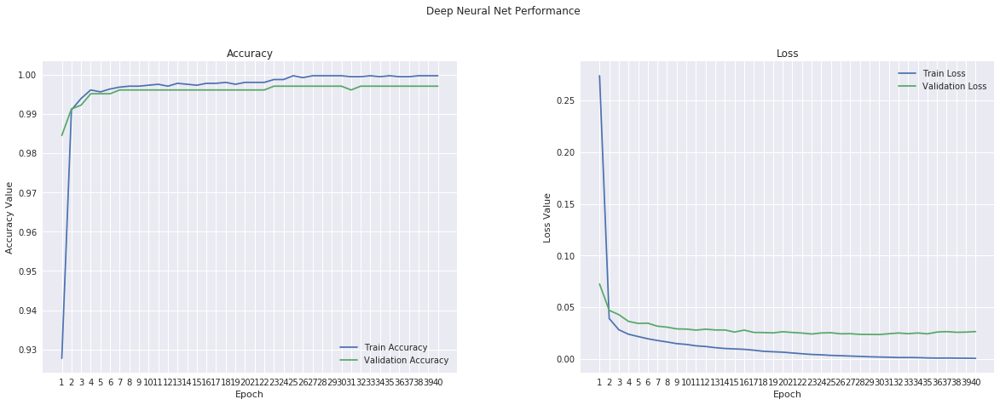

In [43]:
# Define the scaler 
wtp_ss = StandardScaler().fit(X_train)

# Scale the train set
X_train_Ss = wtp_ss.transform(X_train)

# Scale the test set
X_test_Ss = wtp_ss.transform(X_test)

wtp_dnn_model = Sequential()
wtp_dnn_model.add(Dense(64, activation='relu', input_shape=(12,)))
wtp_dnn_model.add(Dense(32, activation='relu'))
wtp_dnn_model.add(Dense(16, activation='relu'))
wtp_dnn_model.add(Dense(1, activation='sigmoid'))

wtp_dnn_model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])

epochs=40
history = wtp_dnn_model.fit(X_train_Ss, y_train, epochs=epochs, batch_size=50, 
                            shuffle=True, validation_split=0.2, verbose=0)

wtp_dnn_ypred = wtp_dnn_model.predict_classes(X_test_Ss)
wtp_dnn_predictions = class_tp.inverse_transform(wtp_dnn_ypred) 

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 7))
t = f.suptitle('Deep Neural Net Performance', fontsize=12)
f.subplots_adjust(top=0.85, wspace=0.3)

epochs = list(range(1,epochs+1))
ax1.plot(epochs, history.history['acc'], label='Train Accuracy')
ax1.plot(epochs, history.history['val_acc'], label='Validation Accuracy')
ax1.set_xticks(epochs)
ax1.set_ylabel('Accuracy Value')
ax1.set_xlabel('Epoch')
ax1.set_title('Accuracy')
l1 = ax1.legend(loc="best")

ax2.plot(epochs, history.history['loss'], label='Train Loss')
ax2.plot(epochs, history.history['val_loss'], label='Validation Loss')
ax2.set_xticks(epochs)
ax2.set_ylabel('Loss Value')
ax2.set_xlabel('Epoch')
ax2.set_title('Loss')
l2 = ax2.legend(loc="best")

From the accuracy and loss plot, you can note that we can stop the learning process at 40<sup>th</sup> or 23<sup>th</sup> epoch, given that at some point the model seems to be tending to overfit if we continue.

Let's get our standard report and check if the DNN models after  40<sup>th</sup> can gave us a good generalization.

Mean Best Accuracy: 99.60%
------------------------------------------------------------
Best Parameters:
{'batch_size': 50, 'epochs': 40, 'steps': None, 'samples': 4136, 'verbose': 0, 'do_validation': True, 'metrics': ['loss', 'acc', 'val_loss', 'val_acc']}
------------------------------------------------------------
Model Performance metrics:
------------------------------
Accuracy:  99.77% 
Precision: 99.77% 
Recall:    99.77% 
F1 Score:  99.77% 

Model Classification report:
------------------------------
              precision    recall  f1-score   support

         red       0.99      1.00      1.00       327
       white       1.00      1.00      1.00       966

   micro avg       1.00      1.00      1.00      1293
   macro avg       1.00      1.00      1.00      1293
weighted avg       1.00      1.00      1.00      1293


Prediction Confusion Matrix:
------------------------------
              Predicted:      
                     red white
Actual: red          326     1
     

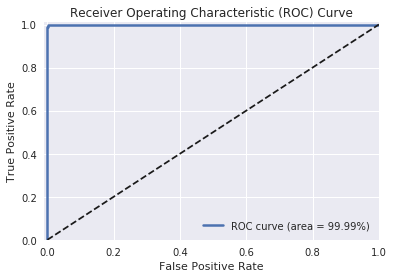

In [44]:
results = get_results(wtp_dnn_model, 'DNN Regressor', X_test_Ss, y_test,
                      target_names = ['red', 'white'], results = results, reasume=False)

As you can see, we got better results then our previous model, a 0.47% better in all metrics performance and a increase of 0.68% on ROC AUC score. The first tree most important features are the same with the change position between first and second, but the forth switched from volatile acidity to residual sugar. which shows that you must be careful when selecting variables by the return of importance, remember that this changes from template to template, but okay, it may be that the changes have occurred due to the multi-collinearity and collinearity that we do not deal with in this case.

Let's compare the two model by a ROC curve plot and see side-by-side some performance metrics:

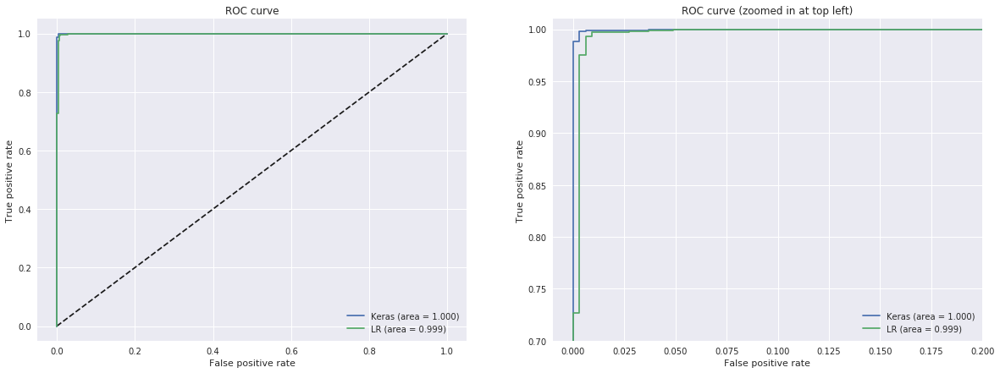

,Prob,CV Accuracy,Accuracy,ROC AUC Score,ROC Area
DNN Regressor,True,0.995962,0.9977,0.999927,0.999927
LogisticRegression,True,0.995164,0.9938,0.992825,0.998977


In [45]:
y_pred_keras = wtp_dnn_model.predict(X_test_Ss).ravel()
fpr_keras, tpr_keras, thresholds_keras = roc_curve(y_test, y_pred_keras)
auc_keras = auc(fpr_keras, tpr_keras)

y_pred_clf = LR.predict_proba(X_test)[:, 1]
fpr_clf, tpr_clf, thresholds_clf = roc_curve(y_test, y_pred_clf)
auc_clf = auc(fpr_clf, tpr_clf)

fig = plt.figure(figsize=(20, 7))
ax = fig.add_subplot(121)
ax.plot([0, 1], [0, 1], 'k--')
ax.plot(fpr_keras, tpr_keras, label='Keras (area = {:.3f})'.format(auc_keras))
ax.plot(fpr_clf, tpr_clf, label='LR (area = {:.3f})'.format(auc_clf))
ax.set_xlabel('False positive rate')
ax.set_ylabel('True positive rate')
ax.set_title('ROC curve')
ax.legend(loc='best')

# Zoom in view of the upper left corner.
ax2 = fig.add_subplot(122)
ax2.set_xlim(-0.01, 0.2)
ax2.set_ylim(0.7, 1.01)
ax2.plot([0, 1], [0, 1], 'k--')
ax2.plot(fpr_keras, tpr_keras, label='Keras (area = {:.3f})'.format(auc_keras))
ax2.plot(fpr_clf, tpr_clf, label='LR (area = {:.3f})'.format(auc_clf))
ax2.set_xlabel('False positive rate')
ax2.set_ylabel('True positive rate')
ax2.set_title('ROC curve (zoomed in at top left)')
ax2.legend(loc='best')
plt.show()

display(results.sort_values(by='Accuracy', ascending=False))

The plot and the results confirms that DNN is better.

### Wine Quality Classifier Models:
Now, let's move on to modeling a wine quality classifier. For this, let's prepare our dataset to focus on our wine quality label feature.

In [46]:
wqp_class_labels = np.array(wines['quality_label'])
target_names = ['low', 'medium', 'high']

cols = wines.columns
cols = list(cols.drop(['type', 'quality_label', 'quality']))
X_train, X_test, y_train, y_test = train_test_split(wines.loc[:, cols], y_ql.values, test_size=0.20, random_state=101)

#### Decision Tree Classifier

 Decision Trees are a non-parametric supervised learning method used for classification and regression. The goal is to create a model that predicts the value of a target variable by learning simple decision rules inferred from the data features.

Fitting 5 folds for each of 48 candidates, totalling 240 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done 240 out of 240 | elapsed:    3.1s finished


Mean Best Accuracy: 72.24%
------------------------------------------------------------
Best Parameters:
{'clf__class_weight': None, 'clf__criterion': 'entropy', 'clf__max_depth': 9, 'clf__min_samples_leaf': 2, 'clf__splitter': 'best'}
------------------------------------------------------------
Model Performance metrics:
------------------------------
Accuracy:  70.38% 
Precision: 70.05% 
Recall:    70.38% 
F1 Score:  70.16% 

Model Classification report:
------------------------------
              precision    recall  f1-score   support

         low       0.64      0.67      0.65       476
      medium       0.76      0.75      0.76       778
        high       0.29      0.18      0.22        39

   micro avg       0.70      0.70      0.70      1293
   macro avg       0.56      0.53      0.54      1293
weighted avg       0.70      0.70      0.70      1293


Prediction Confusion Matrix:
------------------------------
               Predicted:            
                      low me

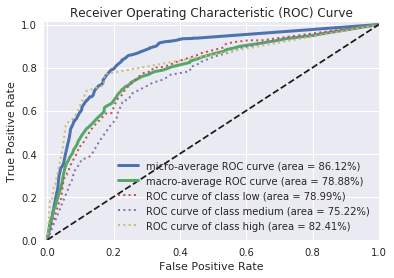

In [47]:
clf = Pipeline([
        ('clf', DecisionTreeClassifier(random_state=101))])  

# a list of dictionaries to specify the parameters that we'd want to tune
criterion = ['gini', 'entropy']
splitter = ['best']
max_depth = [8, 9, 10, 11] # [15, 20, 25]
min_samples_leaf = [2, 3, 5]
class_weight = ['balanced', None] 

param_grid =\
    [{ 'clf__class_weight': class_weight
      ,'clf__criterion': criterion
      ,'clf__splitter': splitter
      ,'clf__max_depth': max_depth
      ,'clf__min_samples_leaf': min_samples_leaf
}]

gs = GridSearchCV(estimator=clf, param_grid=param_grid, scoring='accuracy', cv=5, verbose=1, n_jobs=-1)
DT = Pipeline([
        ('scl', StandardScaler()),
        ('gs', gs)
 ]) 

DT.fit(X_train,y_train)

results = get_results(DT, 'DT First', X_test, y_test, target_names = target_names, reasume=True)

As you can see, we didn't get a wonderful results like in the wine type classification. Special looking at the class based statistics, we can see the recall for the high quality wine samples is pretty bad since a lot of them have been misclassified into medium and low quality ratings. This is kind of expected since we do not have a lot of training samples for high quality wine if you remember our training sample sizes from earlier. If you run this model by setting class_weight to balanced, you will be able to raise the recall and f1-scroe of the high class, but you will have a significant loss in the other performance metrics.

Now look at the feature importance, Alcohol, volatile acidity and sulphates occupy the top tree ranks to classify quality, unlike the previous ones for type classification, which has density, total sulfur dioxide and chlorides as top tree.

The main advantage of decision tree based models is model interpretability, since it is quite easy to understand and interpret the decision rules which led to a specific model prediction. Trees can be even visualized to understand and interpret decision rules better. For better understand, I rerun the decision tree with the same parameters, but without scaling the features and include the following code helps us visualize decision trees:

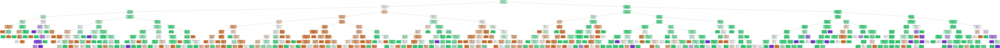

In [48]:
dt = gs.best_estimator_.get_params()['clf']
dt.fit(X_train,y_train)

max_depth=10
graph = Source(tree.export_graphviz(dt, out_file=None, class_names=target_names, filled=True, rounded=True, 
                                    special_characters=False, feature_names=cols, max_depth = max_depth))
png_data = graph.pipe(format='png')
with open('dtree_structure.png','wb') as f:
    f.write(png_data)

Image(png_data)

You remember the collinearity observed between total sulfur dioxide, 5<sup>th</sup> most important, and free sulfur dioxide, 4<sup>th</sup> most important, and between total sulfur dioxide and type, without significant importance?  Respectively 0.72 and 0.70. You remember that our multicollinearity test suggest that we need droop the residual sugar and total sulfur dioxide. Let's do tat to see how this affects our model, so the following code will help us to include a selection of features in our pipeline

In [49]:
cols_clean = cols.copy()
cols_clean.remove('total sulfur dioxide')
cols_clean.remove('residual sugar')

Fitting 5 folds for each of 48 candidates, totalling 240 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done 240 out of 240 | elapsed:    2.5s finished


Mean Best Accuracy: 71.32%
------------------------------------------------------------
Best Parameters:
{'clf__class_weight': None, 'clf__criterion': 'gini', 'clf__max_depth': 10, 'clf__min_samples_leaf': 2, 'clf__splitter': 'best'}
------------------------------------------------------------
Model Performance metrics:
------------------------------
Accuracy:  72.62% 
Precision: 72.21% 
Recall:    72.62% 
F1 Score:  72.38% 

Model Classification report:
------------------------------
              precision    recall  f1-score   support

         low       0.67      0.68      0.68       476
      medium       0.77      0.78      0.78       778
        high       0.32      0.21      0.25        39

   micro avg       0.73      0.73      0.73      1293
   macro avg       0.59      0.56      0.57      1293
weighted avg       0.72      0.73      0.72      1293


Prediction Confusion Matrix:
------------------------------
               Predicted:            
                      low medi

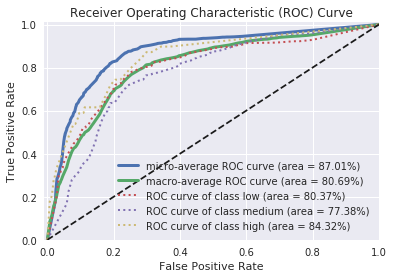

In [50]:
clf = Pipeline([
        ('clf', DecisionTreeClassifier(random_state=101))])  

# a list of dictionaries to specify the parameters that we'd want to tune
criterion = ['gini', 'entropy']
splitter = ['best']
max_depth = [8, 9, 10, 11] # [15, 20, 25]
min_samples_leaf = [2, 3, 5]
class_weight = ['balanced', None] 

param_grid =\
    [{ 'clf__class_weight': class_weight
      ,'clf__criterion': criterion
      ,'clf__splitter': splitter
      ,'clf__max_depth': max_depth
      ,'clf__min_samples_leaf': min_samples_leaf
}]

gs = GridSearchCV(estimator=clf, param_grid=param_grid, scoring='accuracy', cv=5, verbose=1, n_jobs=-1)
DT = Pipeline([
        ('sel', select_fetaures(select_cols=cols_clean)), 
        ('scl', StandardScaler()),
        ('gs', gs)
 ]) 

DT.fit(X_train,y_train)

results = get_results(DT, 'DT Without TSD & RS', X_test, y_test,
                      target_names = target_names, results = results, reasume=False)

In [51]:
display(results.sort_values(by='Accuracy', ascending=False))

,Prob,CV Accuracy,Accuracy,ROC AUC Score,ROC Area
DT Without TSD & RS,True,0.713153,0.7262,0.723468,0.806923
DT First,True,0.722437,0.7038,0.702839,0.788767


As you can see, we reached a worse CV accuracy, but all metrics showed considerable improvement, proving that the elimination of this two characteristics made our decision tree capable of better generalization. without them we have better model classification report and ROC, in special because we improve the prediction of high class. But note, our model get this with only more one level in the tree, which shows us that we can eliminate it safely.

Let's include a PCA step in our pipeline and see, if can help:

Fitting 5 folds for each of 360 candidates, totalling 1800 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done 179 tasks      | elapsed:    8.1s
[Parallel(n_jobs=-1)]: Done 629 tasks      | elapsed:   34.7s
[Parallel(n_jobs=-1)]: Done 1379 tasks      | elapsed:  1.3min
[Parallel(n_jobs=-1)]: Done 1800 out of 1800 | elapsed:  1.8min finished


Mean Best Accuracy: 71.28%
------------------------------------------------------------
Best Parameters:
{'clf__class_weight': None, 'clf__criterion': 'gini', 'clf__max_depth': 10, 'clf__min_samples_leaf': 3, 'clf__splitter': 'best', 'pca__n_components': 10, 'pca__whiten': True}
------------------------------------------------------------
Model Performance metrics:
------------------------------
Accuracy:  71.00% 
Precision: 70.99% 
Recall:    71.00% 
F1 Score:  70.57% 

Model Classification report:
------------------------------
              precision    recall  f1-score   support

         low       0.63      0.71      0.67       476
      medium       0.77      0.74      0.75       778
        high       0.50      0.13      0.20        39

   micro avg       0.71      0.71      0.71      1293
   macro avg       0.63      0.53      0.54      1293
weighted avg       0.71      0.71      0.71      1293


Prediction Confusion Matrix:
------------------------------
               Predict

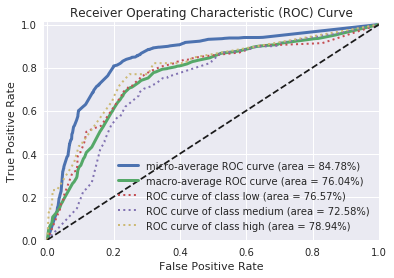

,Prob,CV Accuracy,Accuracy,ROC AUC Score,ROC Area
DT Without TSD & RS,True,0.713153,0.7262,0.723468,0.806923
DT PCA,True,0.712766,0.7100,0.709132,0.760371
DT First,True,0.722437,0.7038,0.702839,0.788767


In [52]:
clf = Pipeline([
        ('pca', PCA(random_state = 101)),
        ('clf', DecisionTreeClassifier(random_state=101))])  

# a list of dictionaries to specify the parameters that we'd want to tune
SEL = cols_clean
n_components= [len(SEL)-2, len(SEL)-1, len(SEL)] 
whiten = [True, False]
criterion = ['gini', 'entropy']
splitter = ['best']
max_depth = [8, 9, 10, 11, 12] # [15, 20, 25]
min_samples_leaf = [2, 3, 4]
class_weight = ['balanced', None] 

param_grid =\
    [{ 'clf__class_weight': class_weight
      ,'clf__criterion': criterion
      ,'clf__splitter': splitter
      ,'clf__max_depth': max_depth
      ,'clf__min_samples_leaf': min_samples_leaf
      ,'pca__n_components' : n_components
      ,'pca__whiten' : whiten
}]

gs = GridSearchCV(estimator=clf, param_grid=param_grid, scoring='accuracy', cv=5, verbose=1, n_jobs=-1)
DT = Pipeline([
        ('sel', select_fetaures(select_cols=SEL)), 
        ('scl', StandardScaler()),
        ('gs', gs)
 ]) 

DT.fit(X_train,y_train)

results = get_results(DT, 'DT PCA', X_test, y_test, 
                      target_names = target_names, results = results, reasume=False)

display(results.sort_values(by='Accuracy', ascending=False))

We didn't get any improvements with PCA if compared with our DT without TSD and RS, but note that is better than our DT first and didn't make misclassification of high as low and vice-versa.

If you run the code above without this cut two features, it will have less improves and make some mistakes from high and low, but get this little improvement with cut two PCA components, like cut tow features.

Think of the following hypothesis, you will make use of this model to suggest to a customer a wine within a certain quality level, surely you would like to avoid misclassification between high and low, not seeing too much problem if you erroneously classify one or the other as medium. In this case, precision and recall are more important than accuracy, especially if the difference is small. In our models we have a difference of 1.62%, but the most important is that we have to work to still improve it.

#### Ensemble models
Moving forward with our mission of improving our wine quality predictive model, let’s look at some ensemble modeling methods. Ensemble models are typically Machine Learning models that combine or take a weighted (average\majority) vote of the predictions of each of the individual base model estimators that have been built using supervised methods of their own. The ensemble is expected to generalize better over underlying data, be more robust, and make superior predictions as compared to each individual base model. Ensemble models can be categorized under three major families.
- ***Bagging methods***: 
    In this approach, a bootstrap samples, i.e. independent samples with replacement, are taken and several base models are built on these sampled datasets. At any instance, an average of all predictions from the individual estimators is taken for the ensemble model to make its final prediction. Random sampling tries to reduce model variance, reduce overfitting, and boost prediction accuracy. 
- ***Boosting methods***: 
    In this method the idea is to combine several weak base learners to form a powerful ensemble. Weak learners are trained sequentially over multiple iterations of the training data with weight modifications inserted at each retrain phase. At each re-training of a weak base learner, higher weights are assigned to those training instances which were misclassified previously. Thus, these methods try to focus on training instances which it wrongly predicted in the previous training sequence. Boosted models are prone to over-fitting so one should be very careful. Examples include Gradient Boosting, AdaBoost, and the very popular XGBoost.
- ***Stacking methods***:
    In stacking based methods, we first build multiple base models over the training data. Then the final ensemble model is built by taking the output predictions from these models as its additional inputs for training to make the final prediction.
 
#### Random Forest Classifier
Let's now try building a model using a bagging methods by run a random forests

A [random forest](http://scikit-learn.org/stable/modules/generated/sklearn.ensemble.RandomForestClassifier.html#sklearn.ensemble.RandomForestClassifier) is a meta estimator that fits a number of decision tree classifiers on various sub-samples of the dataset and use averaging to improve the predictive accuracy and control over-fitting. The sub-sample size is always the same as the original input sample size but the samples are drawn with replacement if bootstrap=True (default).

In the random forest model, each base learner is a decision tree model trained on a bootstrap sample of the training data. Besides this, when we want to split a decision node in the tree, the split is chosen from a random subset of all the features instead of taking the best split from all the features. Due to the introduction of this randomness, bias increases and when we average the result from all the trees in the forest, the overall variance decreases, giving us a robust ensemble model which generalizes well. We will be using the RandomForestClassifier from scikit-learn, which averages the probabilistic prediction from all the trees in the forest for the final prediction instead of taking the actual prediction votes and then averaging it

Fitting 5 folds for each of 24 candidates, totalling 120 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:   24.5s
[Parallel(n_jobs=-1)]: Done 120 out of 120 | elapsed:  1.4min finished


Mean Best Accuracy: 80.56%
------------------------------------------------------------
Best Parameters:
{'clf__criterion': 'entropy', 'clf__max_depth': None, 'clf__min_samples_split': 2, 'clf__n_estimators': 175}
------------------------------------------------------------
Model Performance metrics:
------------------------------
Accuracy:  82.13% 
Precision: 82.44% 
Recall:    82.13% 
F1 Score:  81.65% 

Model Classification report:
------------------------------
              precision    recall  f1-score   support

         low       0.80      0.76      0.78       476
      medium       0.83      0.89      0.86       778
        high       1.00      0.31      0.47        39

   micro avg       0.82      0.82      0.82      1293
   macro avg       0.88      0.65      0.70      1293
weighted avg       0.82      0.82      0.82      1293


Prediction Confusion Matrix:
------------------------------
               Predicted:            
                      low medium high
Actual: low 

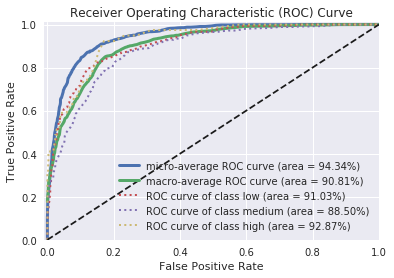

In [53]:
clf = Pipeline([
        #('pca', PCA(random_state = 101)),
        ('clf', RandomForestClassifier(random_state=101))])  

# a list of dictionaries to specify the parameters that we'd want to tune
SEL = cols
n_components= [len(SEL)-2, len(SEL)-1, len(SEL)] 
whiten = [True, False]
criterion = ['gini', 'entropy']
class_weight = ['balanced', None] 
n_estimators = [155, 175]  
max_depth  = [20, None] #, 3, 4, 5, 10] # 
min_samples_split = [2, 3, 4]
min_samples_leaf = [1] #, 2 , 3]

param_grid =\
    [{ #'clf__class_weight': class_weight
      'clf__criterion': criterion
      ,'clf__n_estimators': n_estimators      
      ,'clf__min_samples_split': min_samples_split
      ,'clf__max_depth': max_depth
      #,'clf__min_samples_leaf': min_samples_leaf
      #,'pca__n_components' : n_components
      #,'pca__whiten' : whiten
}]

gs = GridSearchCV(estimator=clf, param_grid=param_grid, scoring='accuracy', cv=5, verbose=1, n_jobs=-1)
RF = Pipeline([
        #('sel', select_fetaures(select_cols=SEL)), 
        ('scl', StandardScaler()),
        ('gs', gs)
 ]) 

RF.fit(X_train,y_train)

results = get_results(RF, 'RF', X_test, y_test, 
                      target_names = target_names, results = results, reasume=False)

The model prediction results on the test dataset depict an overall F1 Score and model accuracy of approximately 82.13%, as seen above. This is quite good considering we got an improvement of 9,47%  from the best decision tree model. Also we can see that no low quality wine sample has been misclassified as high and vice-versa. There is a considerable overlap between medium and high\low quality wine samples but that is expected given the nature of the data and class distribution.

As we have few characteristics and it would be necessary to remove only two to solve the problems caused by collinearity and multicollinearity, it is interesting to note that a bagging method is able to handle this, without the necessity of having to delete them, this is because different trees are making use of different sets. If you prefer to check for yourself change the above code to other selections and include or removing the PCA.

Let's look at some model prediction interpretations, for this, we will be leveraging skater and look at model predictions. We will try to interpret why the model predicted a class label and which features were influential in its decision. First we build a LimeTabularExplainer object using the following snippet, which will help us in interpreting and explaining predictions.

#### XGBoost (eXtreme Gradient Boosting)

[XGBoost](https://xgboost.readthedocs.io/en/latest/) is an advanced implementation of gradient boosting algorithm. It's a highly sophisticated algorithm, powerful enough to deal with all sorts of irregularities of data.

- Standard GBM implementation has no **regularization** like XGBoost, therefore it also helps to reduce overfitting.
- XGBoost implements **parallel processing** to making a tree using all cores and is blazingly faster as compared to GBM.
- XGBoost also supports implementation on Hadoop.
- **High flexibility**, it allow users to define custom optimization objectives and evaluation criteria.
- XGBoost has an **in-built routine to handle missing values**.
- It make splits up to the max_depth specified and then start **pruning the tree backwards** and remove splits beyond which there is no positive gain.
- Sometimes a split of negative loss say -2 may be followed by a split of positive loss +10. GBM would stop as it encounters -2. But XGBoost will go deeper and it will see a **combined effect** of +8 of the split and keep both.
- XGBoost **allows user to run a cross-validation** at each iteration of the boosting process and thus it is easy to get the exact optimum number of boosting iterations in a single run. You don't need use grid search.
- User can **start training** an XGBoost model **from** its last iteration of **previous run**. 

The overall parameters have been divided into 3 categories by XGBoost authors, let's see the most importants:
1. General Parameters: Guide the overall functioning:
 - **booster**: default is gbtree fom ['gbtree', 'gblinear']
<p><p>
2. Booster Parameters: Guide the individual booster (tree/regression) at each step:
 - **learning_rate** (eta): default is 0.3. Makes the model more robust by shrinking the weights on each step. Typical final values to be used: 0.01-0.2
 - **min_child_weight**: default is 1. Defines the minimum sum of weights of all observations required in a child. Used to control over-fitting. Higher values prevent a over-fitting, but too high values can lead to under-fitting hence, it should be **tuned** using CV.
 - **max_depth**: default is 6. The maximum depth of a tree used to control over-fitting and should be **tuned** using CV. Typical values: 3-10
 - **max_leaf_nodes**: The maximum number of terminal nodes or leaves in a tree. Can be defined in place of max_depth. Since binary trees are created, a depth of 'n' would produce a maximum of 2^n leaves. If this is defined, GBM will ignore max_depth.
 - **gamma**: default is 0. A node is split only when the resulting split gives a positive reduction in the loss function. Gamma specifies the minimum loss reduction required to make a split. Makes the algorithm conservative. **The values can vary depending on the loss function** and should be **tuned**.
 - **max_delta_step**: default is 0. In maximum delta step we allow each tree's weight estimation to be. If the value is set to 0, it means there is no constraint. If it is set to a positive value, it can help making the update step more conservative. Usually this parameter is not needed, but **it might help in logistic regression when class is extremely imbalanced**.
 - **subsample**: default is 1. Denotes the fraction of observations to be randomly samples for each tree. Lower values make the algorithm more conservative and prevents overfitting but too small values might lead to under-fitting. Typical values: 0.5-1
 - **colsample_bytree**: default is 1. Denotes the fraction of columns to be randomly samples for each tree. Typical values: 0.5-1
 - **colsample_bylevel**: default is 1. Denotes the subsample ratio of columns for each split, in each level.
 - **reg_lambda** (lambda): default is 1. L2 regularization term on weights, analogous to Ridge regression, it should be explored to reduce overfitting.
 - **reg_alpha** (alpha): default is 0. L1 regularization term on weight, analogous to Lasso regression, Can be used in case of very high dimensionality so that the algorithm runs faster when implemented.
 - **scale_pos_weight**: default is 1. A value greater than 0 should be used in case of high class imbalance as it helps in faster convergence. **To balance use** `sum(negative cases)/sum(positive cases)` and Use AUC for evaluation.
<p><p>
3. Learning Task Parameters: These parameters are used to define the optimization objective the metric to be calculated at each step: 
 - **objective**: default is reg:linear and binary:logistic for XGBClassifier. This defines the loss function to be minimized. Mostly used values are: <p>
       - binary:logistic –logistic regression for binary classification, returns predicted probability (not class)
       - multi:softmax –multiclass classification using the softmax objective, returns predicted class (not probabilities). You also need to set an additional num_class (number of classes) parameter defining the number of unique classes
       - multi:softprob –same as softmax, but returns predicted probability of each data point belonging to each class.
 - **eval_metric**: The default values are rmse for regression and error for classification. The metric to be used for validation data. Typical values are: 
       - rmse – root mean square error
       - mae – mean absolute error
       - logloss – negative log-likelihood
       - error – Binary classification error rate (0.5 threshold)
       - merror – Multiclass classification error rate
       - mlogloss – Multiclass logloss
       - auc: Area under the curve
 - **seed**: The random number seed. Can be used for generating reproducible results and also for parameter tuning.
<p><p>

Before proceeding further, since cgb don't accept categorical let's change it to boolean or integer.

Fitting 3 folds for each of 1 candidates, totalling 3 fits


[Parallel(n_jobs=3)]: Using backend LokyBackend with 3 concurrent workers.
[Parallel(n_jobs=3)]: Done   3 out of   3 | elapsed:   10.0s finished


Mean Best Accuracy: 78.26%
------------------------------------------------------------
Best Parameters:
{'clf__booster': 'gbtree', 'clf__learning_rate': 0.1, 'clf__max_depth': 15, 'clf__n_estimators': 112, 'clf__objective': 'multi:softmax', 'clf__reg_alpha': 0.05, 'clf__reg_lambda': 0.7}
------------------------------------------------------------
Model Performance metrics:
------------------------------
Accuracy:  81.90% 
Precision: 81.92% 
Recall:    81.90% 
F1 Score:  81.50% 

Model Classification report:
------------------------------
              precision    recall  f1-score   support

         low       0.79      0.78      0.78       476
      medium       0.84      0.87      0.85       778
        high       0.86      0.31      0.45        39

   micro avg       0.82      0.82      0.82      1293
   macro avg       0.83      0.65      0.70      1293
weighted avg       0.82      0.82      0.81      1293


Prediction Confusion Matrix:
------------------------------
            

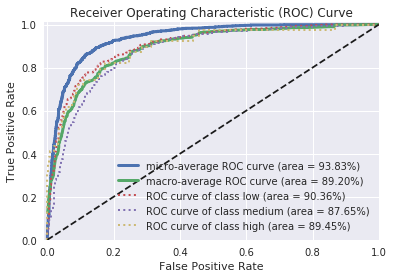

In [56]:
clf = Pipeline([
        ('clf', xgb.XGBClassifier(base_score=0.5, colsample_bylevel=1, n_jobs=1,
                       colsample_bytree=1, gamma=0.0001, max_delta_step=0, random_state=101, 
                       silent=True, subsample=1))])

SEL = cols_clean
n_est = [112] #112
max_depth = [15] 
learning_rate = [0.1] 
reg_lambda = [0.7] 
reg_alpha= [0.05]
booster = ['gbtree'] #  'dart'] #,'gblinear',
objective = ['multi:softmax'] #, 'multi:softprob']

param_grid =\
    [{ 
      'clf__n_estimators': n_est
      ,'clf__booster': booster
      ,'clf__objective': objective
      ,'clf__learning_rate': learning_rate
      ,'clf__reg_lambda': reg_lambda
      ,'clf__reg_alpha': reg_alpha
      ,'clf__max_depth': max_depth
}]

gs = GridSearchCV(estimator=clf, param_grid=param_grid, scoring='accuracy', cv=3,
                  verbose=1, n_jobs=3)

XGBC = Pipeline([
        #('sel', select_fetaures(select_cols=SEL)), 
        ('scl', StandardScaler()),
        ('gs', gs)
 ]) 

XGBC.fit(X_train,y_train)

results = get_results(XGBC, 'XGBC', X_test, y_test, 
                      target_names = target_names, results = results, reasume=False)

It achieved a good performance but no higher than RF and commented on an error in classifying as low a high quality wine.

#### KNeighbors Classifier

Neighbors-based classification is a type of instance-based learning or non-generalizing learning: it does not attempt to construct a general internal model, but simply stores instances of the training data. Classification is computed from a simple majority vote of the nearest neighbors of each point: a query point is assigned the data class which has the most representatives within the nearest neighbors of the point.

scikit-learn implements two different nearest neighbors classifiers: [KNeighborsClassifier](http://scikit-learn.org/stable/modules/generated/sklearn.neighbors.KNeighborsClassifier.html#sklearn.neighbors.KNeighborsClassifier) implements learning based on the  nearest neighbors of each query point, where  is an integer value specified by the user. [RadiusNeighborsClassifier](http://scikit-learn.org/stable/modules/generated/sklearn.neighbors.RadiusNeighborsClassifier.html#sklearn.neighbors.RadiusNeighborsClassifier) implements learning based on the number of neighbors within a fixed radius of each training point, where is a floating-point value specified by the user.

We will create a KNeighborsClassifier model with following parameters:
- n_neighbors: Number of neighbors to use by default for kneighbors queries.
- weights: weight function used in prediction. 
    - 'uniform': uniform weights. All points in each neighborhood are weighted equally.
    - 'distance': weight points by the inverse of their distance. in this case, closer neighbors of a query point will have a greater influence than neighbors which are further away.
    - [callable]: a user-defined function which accepts an array of distances, and returns an array of the same shape containing the weights.
- algorithm: Algorithm used to compute the nearest neighbors:
    - 'ball_tree' will use BallTree
    = 'kd_tree' will use KDTree
    = 'brute' will use a brute-force search.
    = 'auto' will attempt to decide the most appropriate algorithm based on the values passed to fit method.
    
    Note: fitting on sparse input will override the setting of this parameter, using brute force.

- leaf_size: Leaf size passed to BallTree or KDTree. This can affect the speed of the construction and query, as well as the memory required to store the tree. The optimal value depends on the nature of the problem.
- p: Power parameter for the Minkowski metric. When p = 1, this is equivalent to using manhattan_distance (l1), and euclidean_distance (l2) for p = 2. For arbitrary p, minkowski_distance (l_p) is used.

Fitting 5 folds for each of 12 candidates, totalling 60 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:    9.0s
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:   11.8s finished


Mean Best Accuracy: 78.55%
------------------------------------------------------------
Best Parameters:
{'clf__algorithm': 'ball_tree', 'clf__leaf_size': 12, 'clf__n_neighbors': 12, 'clf__p': 1, 'clf__weights': 'distance'}
------------------------------------------------------------
Model Performance metrics:
------------------------------
Accuracy:  80.90% 
Precision: 80.90% 
Recall:    80.90% 
F1 Score:  80.46% 

Model Classification report:
------------------------------
              precision    recall  f1-score   support

         low       0.78      0.75      0.77       476
      medium       0.82      0.87      0.85       778
        high       0.86      0.31      0.45        39

   micro avg       0.81      0.81      0.81      1293
   macro avg       0.82      0.64      0.69      1293
weighted avg       0.81      0.81      0.80      1293


Prediction Confusion Matrix:
------------------------------
               Predicted:            
                      low medium high
Ac

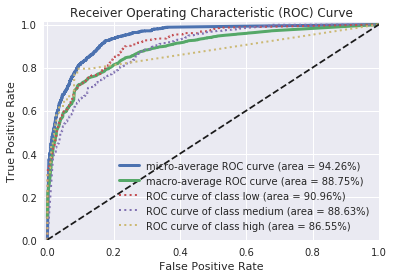

In [57]:
clf = Pipeline([
        #('pca', PCA(random_state = 101)),
        ('clf', KNeighborsClassifier())])

# a list of dictionaries to specify the parameters that we'd want to tune
SEL = cols_clean
n_components= [len(SEL)-2, len(SEL)-1, len(SEL)] 
whiten = [True, False]

param_grid =\
    [{'clf__n_neighbors': [10, 11, 12, 13] 
     ,'clf__weights': ['distance'] 
     ,'clf__algorithm' : ['ball_tree'] #, 'brute', 'auto',  'kd_tree', 'brute']
     ,'clf__leaf_size': [12, 11, 13]
     ,'clf__p': [1] 
     #,'pca__n_components' : n_components
     #,'pca__whiten' : whiten
     }]

gs = GridSearchCV(estimator=clf, param_grid=param_grid, scoring='accuracy', cv=5, verbose=1, n_jobs=-1)

KNNC = Pipeline([
        ('sel', select_fetaures(select_cols=SEL)),
        ('scl', StandardScaler()),
        ('gs', gs)
 ]) 

KNNC.fit(X_train,y_train)

results = get_results(KNNC, 'KNeighborsClassifier', X_test, y_test, 
                      target_names = target_names, results = results, reasume=False)

It achieved a good performance, not making errors of classification between high and low, but did not surpass the RF.

Note that the third and fourth most important features are different between the two models, but they are the same in the first and second. Here the total sulfur dioxide and residual sugar don't have importance because we drop them.

#### Gradient Boosting for Classification

[GB](http://scikit-learn.org/stable/modules/generated/sklearn.ensemble.GradientBoostingClassifier.html) builds an additive model in a forward stage-wise fashion; it allows for the optimization of arbitrary differentiable loss functions. In each stage n_classes_ regression trees are fit on the negative gradient of the binomial or multinomial deviance loss function. Binary classification is a special case where only a single regression tree is induced.

- loss: loss function to be optimized. 'deviance' refers to deviance (= logistic regression) for classification with probabilistic outputs. For loss 'exponential' gradient boosting recovers the AdaBoost algorithm.

Fitting 5 folds for each of 1 candidates, totalling 5 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:  2.1min finished


Mean Best Accuracy: 78.94%
------------------------------------------------------------
Best Parameters:
{'clf__learning_rate': 0.01, 'clf__max_depth': 10, 'clf__n_estimators': 400}
------------------------------------------------------------
Model Performance metrics:
------------------------------
Accuracy:  81.98% 
Precision: 82.13% 
Recall:    81.98% 
F1 Score:  81.61% 

Model Classification report:
------------------------------
              precision    recall  f1-score   support

         low       0.79      0.78      0.78       476
      medium       0.84      0.87      0.85       778
        high       0.93      0.33      0.49        39

   micro avg       0.82      0.82      0.82      1293
   macro avg       0.85      0.66      0.71      1293
weighted avg       0.82      0.82      0.82      1293


Prediction Confusion Matrix:
------------------------------
               Predicted:            
                      low medium high
Actual: low           369    107    0
      

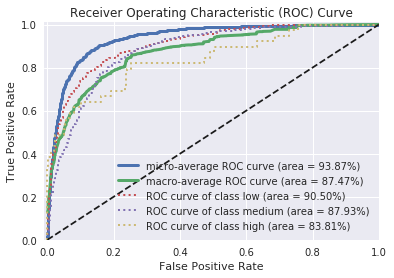

In [58]:
clf = Pipeline([
        #('pca', PCA(random_state = 101)),
        ('clf', GradientBoostingClassifier(random_state=101))])  

# a list of dictionaries to specify the parameters that we'd want to tune
#cv=None, dual=False,  scoring=None, refit=True,  multi_class='ovr'
SEL = cols_clean
n_components= [len(SEL)-2, len(SEL)-1, len(SEL)] 
whiten = [True, False]
learning_rate =  [1e-02] #, 5e-03, 2e-02]
n_estimators= [400]
max_depth = [10]
n_comp = [2, 3, 4, 5]

param_grid =\
    [{'clf__learning_rate': learning_rate
     ,'clf__max_depth': max_depth
     ,'clf__n_estimators' : n_estimators 
     #,'pca__n_components' : n_components
     #,'pca__whiten' : whiten
}]

gs = GridSearchCV(estimator=clf, param_grid=param_grid, scoring='accuracy', cv=5, verbose=1, n_jobs=-1)

GBC = Pipeline([
        #('sel', select_fetaures(select_cols=SEL)),
        ('scl', StandardScaler()),
        ('gs', gs)
 ])  

GBC.fit(X_train,y_train)

results = get_results(GBC, 'GradientBoostingClassifier', X_test, y_test, 
                      target_names = target_names, results = results, reasume=False)

This model has good performance even without removing the two features, but also does not exceed the RF and commits 2 errors of classification of high as low quality.

#### AdaBoost classifier

Is a meta-estimator that begins by fitting a classifier on the original dataset and then fits additional copies of the classifier on the same dataset but where the weights of incorrectly classified instances are adjusted such that subsequent classifiers focus more on difficult cases.

This class implements the algorithm known as [AdaBoost-SAMME](http://scikit-learn.org/stable/modules/generated/sklearn.ensemble.AdaBoostClassifier.html#sklearn.ensemble.AdaBoostClassifier).

**Parameters:**

 - ***n_estimators***: The maximum number of estimators at which boosting is terminated. In case of perfect fit, the learning procedure is stopped early.

 - ***learning_rate***: Learning rate shrinks the contribution of each classifier by learning_rate. There is a trade-off between learning_rate and n_estimators.

 - ***algorithm***: {‘SAMME’, ‘SAMME.R’}. If ‘SAMME.R’ then use the SAMME.R real boosting algorithm. base_estimator must support calculation of class probabilities. If ‘SAMME’ then use the SAMME discrete boosting algorithm. The SAMME.R algorithm typically converges faster than SAMME, achieving a lower test error with fewer boosting iterations.

Fitting 5 folds for each of 6 candidates, totalling 30 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   41.8s finished


Mean Best Accuracy: 70.46%
------------------------------------------------------------
Best Parameters:
{'clf__algorithm': 'SAMME.R', 'clf__learning_rate': 0.15, 'clf__n_estimators': 500}
------------------------------------------------------------
Model Performance metrics:
------------------------------
Accuracy:  71.93% 
Precision: 69.63% 
Recall:    71.93% 
F1 Score:  70.52% 

Model Classification report:
------------------------------
              precision    recall  f1-score   support

         low       0.68      0.60      0.64       476
      medium       0.74      0.83      0.78       778
        high       0.00      0.00      0.00        39

   micro avg       0.72      0.72      0.72      1293
   macro avg       0.47      0.48      0.47      1293
weighted avg       0.70      0.72      0.71      1293


Prediction Confusion Matrix:
------------------------------
               Predicted:            
                      low medium high
Actual: low           286    189    1

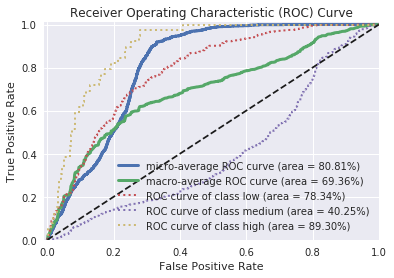

In [59]:
clf = Pipeline([
        #('pca', PCA(random_state = 101)),
        ('clf', AdaBoostClassifier(random_state=101))])

# a list of dictionaries to specify the parameters that we'd want to tune
SEL = cols_clean
n_components= [len(SEL)-2, len(SEL)-1, len(SEL)] 
whiten = [True, False]
n_comp = [2, 3, 4, 5]

param_grid =\
    [{'clf__learning_rate': [2e-01, 15e-02]
     ,'clf__n_estimators': [500, 600, 700] 
     ,'clf__algorithm' : ['SAMME.R'] # 'SAMME'
     #,'pca__n_components' : n_components
     #,'pca__whiten' : whiten
     #,'lda__n_components': n_comp
     }]

gs = GridSearchCV(estimator=clf, param_grid=param_grid, scoring='accuracy', cv=5, verbose=1, n_jobs=-1)

ADAB = Pipeline([
        #('sel', select_fetaures(select_cols=SEL)),
        ('scl', StandardScaler()),
        #('lda', LDA(store_covariance=True)),
        ('gs', gs)
 ])  

ADAB.fit(X_train,y_train)

results = get_results(ADAB, 'AdaBoostClassifier', X_test, y_test, 
                      target_names = target_names, results = results, reasume=False)

This model didn't gave a good performance and shows to much loss in the high quality classification. Let's move on.

#### Logistic Regression

This class implements regularized [logistic regression](http://scikit-learn.org/stable/modules/generated/sklearn.linear_model.LogisticRegression.html) using the 'liblinear' library, 'newton-cg', 'sag' and 'lbfgs' solvers. It can handle both dense and sparse input. 

**Additional Parameters**
 - class_weight : dict or 'balanced', default: None
   The "balanced" mode uses the values of y to automatically adjust weights inversely proportional to class frequencies in the input data as ``n_samples / (n_classes * np.bincount(y))``.

   For how class_weight works: It penalizes mistakes in samples of class[i] with class_weight[i] instead of 1. So higher class-weight means you want to put more emphasis on a class. For example, our class 0 is 1.24 times more frequent than class 1. So you should increase the class_weight of class 1 relative to class 0, say {1: 0.6, 0: 0.4}. If the class_weight doesn't sum to 1, it will basically change the regularization parameter.

   "balanced" basically means replicating the smaller class until you have as many samples as in the larger one, but in an implicit way.
   

 - warm_start : bool, default: False. Useless for liblinear solver.
 - ``'clf__multi_class' : ['ovr', 'multinomial']`` for ``'clf__solver': ['newton-cg', 'sag', 'lbfgs']``

**Attributes:**
 - coef_ : array, shape (1, n_features) or (n_classes, n_features)
 - intercept_ : array, shape (1,) or (n_classes,)
 - n_iter_ : array, shape (n_classes,) or (1, )

Fitting 5 folds for each of 19 candidates, totalling 95 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  76 tasks      | elapsed:    5.6s
[Parallel(n_jobs=-1)]: Done  88 out of  95 | elapsed:    6.6s remaining:    0.5s
[Parallel(n_jobs=-1)]: Done  95 out of  95 | elapsed:    7.0s finished


Mean Best Accuracy: 71.30%
------------------------------------------------------------
Best Parameters:
{'clf__C': 1.0, 'clf__class_weight': 'balanced', 'clf__penalty': 'l1', 'clf__solver': 'liblinear', 'clf__tol': 1e-06}
------------------------------------------------------------
Model Performance metrics:
------------------------------
Accuracy:  72.70% 
Precision: 73.88% 
Recall:    72.70% 
F1 Score:  71.92% 

Model Classification report:
------------------------------
              precision    recall  f1-score   support

         low       0.65      0.72      0.69       476
      medium       0.78      0.76      0.77       778
        high       1.00      0.05      0.10        39

   micro avg       0.73      0.73      0.73      1293
   macro avg       0.81      0.51      0.52      1293
weighted avg       0.74      0.73      0.72      1293


Prediction Confusion Matrix:
------------------------------
               Predicted:            
                      low medium high
Act

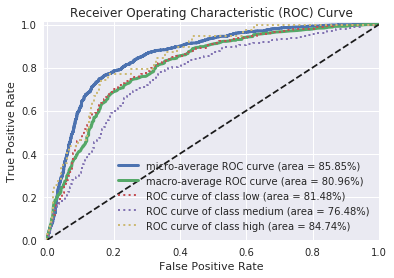

In [60]:
clf = Pipeline([
        #('pca', PCA(random_state = 101)),
        ('clf', LogisticRegression(random_state=101))])  

# a list of dictionaries to specify the parameters that we'd want to tune
SEL = cols_clean
n_components= [len(SEL)-2, len(SEL)-1, len(SEL)] 
whiten = [True, False]
C =  [1.0] #, 1e-06, 5e-07, 1e-05, 1e-04, 1e-03, 1e-02, 1e-01, 10.0, 100.0, 1000.0]
tol = [1e-06] #, 5e-07, 1e-05, 1e-04, 1e-03, 1e-02, 1e-01]

param_grid =\
    [{'clf__C': C
     ,'clf__solver': ['liblinear', 'saga'] 
     ,'clf__penalty': ['l1', 'l2']
     ,'clf__tol' : tol 
     ,'clf__class_weight': ['balanced']
     #,'pca__n_components' : n_components
     #,'pca__whiten' : whiten
},
    {'clf__C': C
     ,'clf__max_iter': [3, 9, 2, 7, 4]
     ,'clf__solver': ['newton-cg', 'sag', 'lbfgs']
     ,'clf__penalty': ['l2']
     ,'clf__tol' : tol 
     ,'clf__class_weight': ['balanced'] 
     #,'pca__n_components' : n_components
     #,'pca__whiten' : whiten
}]

gs = GridSearchCV(estimator=clf, param_grid=param_grid, scoring='accuracy', cv=5, verbose=1, n_jobs=-1)

LR = Pipeline([
        ('sel', select_fetaures(select_cols=SEL)),
        ('scl', StandardScaler()),
        ('gs', gs)
 ])  

LR.fit(X_train,y_train)

results = get_results(LR, 'LogisticRegression', X_test, y_test, 
                      target_names = target_names, results = results, reasume=False)

This model did not present a good result and made one mistake in predict a high quality as low. However observing its ROC curve it is apparently more stable and may be a good candidate for meta classifier model, base of a staking model

#### Linear Support Vector Classification

[LSVC](http://scikit-learn.org/stable/modules/generated/sklearn.svm.LinearSVC.html#sklearn.svm.LinearSVC) is similar to SVC with parameter kernel=’linear’, but implemented in terms of liblinear rather than libsvm, so it has more flexibility in the choice of penalties and loss functions and should scale better to large numbers of samples.

This class supports both dense and sparse input and the multiclass support is handled according to a one-vs-the-rest scheme.

The combination of penalty='l1' and loss='hinge' is not supported, and penalty='l2' and loss='hinge' needs dual=True.

Fitting 5 folds for each of 27 candidates, totalling 135 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done 135 out of 135 | elapsed:    3.9s finished


Mean Best Accuracy: 71.28%
------------------------------------------------------------
Best Parameters:
{'clf__C': 0.08, 'clf__dual': True, 'clf__loss': 'hinge', 'clf__max_iter': 9, 'clf__penalty': 'l2', 'clf__tol': 1e-06}
------------------------------------------------------------
Model Performance metrics:
------------------------------
Accuracy:  72.78% 
Precision: 71.12% 
Recall:    72.78% 
F1 Score:  71.84% 

Model Classification report:
------------------------------
              precision    recall  f1-score   support

         low       0.65      0.74      0.69       476
      medium       0.78      0.76      0.77       778
        high       0.00      0.00      0.00        39

   micro avg       0.73      0.73      0.73      1293
   macro avg       0.48      0.50      0.49      1293
weighted avg       0.71      0.73      0.72      1293


Prediction Confusion Matrix:
------------------------------
               Predicted:            
                      low medium high
Ac

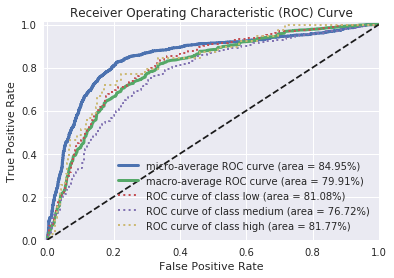

In [61]:
clf = Pipeline([
        ('pca', PCA(random_state = 101)),
        ('clf', LinearSVC(random_state=101, multi_class='ovr', class_weight='balanced'))])

# a list of dictionaries to specify the parameters that we'd want to tune
SEL = cols_clean
n_components= [len(SEL)-2, len(SEL)-1, len(SEL)] 
whiten = [True, False]
C =  [0.06, 0.08, 0.07] #, 1.0, 10.0, 100.0, 1000.0]
tol = [1e-06]
max_iter = [10, 15, 9]

param_grid =\
    [{'clf__loss': ['hinge']
     ,'clf__tol': tol
     ,'clf__C': C
     ,'clf__penalty': ['l2']
     ,'clf__max_iter' : max_iter
     ,'clf__dual' : [True]
     #,'pca__n_components' : n_components
     #,'pca__whiten' : whiten
     }
    ,{'clf__loss': ['squared_hinge']
     ,'clf__tol': tol
     ,'clf__C': C
     ,'clf__penalty': ['l2', 'l1']
     ,'clf__max_iter' : max_iter
     ,'clf__dual' : [False]
     #,'pca__n_components' : n_components
     #,'pca__whiten' : whiten
     }]

gs = GridSearchCV(estimator=clf, param_grid=param_grid, scoring='accuracy', cv=5, verbose=1, n_jobs=-1)

LSVC = Pipeline([
        ('sel', select_fetaures(select_cols=SEL)),
        ('scl', StandardScaler()),
        #('lda', LDA(n_components = 2, store_covariance=True)),
        ('gs', gs)
 ])  

LSVC.fit(X_train,y_train)

results = get_results(LSVC, 'LinearSVC', X_test, y_test, 
                      target_names = target_names, results = results, reasume=False)

This model is terrible, especially in classifying high quality wines, but it is interesting like LR it also does not classify wines of medium and low quality as high, and may be an option to be evaluated in a staking model, but KNNC and GBC did it best by hitting more predictions of high quality wines as high.

### Check the best results from the models hyper parametrization

In [62]:
results.sort_values(by='Accuracy', ascending=False)

,Prob,CV Accuracy,Accuracy,ROC AUC Score,ROC Area
RF,True,0.805609,0.8213,0.807632,0.908088
GradientBoostingClassifier,True,0.789362,0.8198,0.810580,0.874716
XGBC,True,0.782592,0.8190,0.809842,0.892034
KNeighborsClassifier,True,0.785493,0.8090,0.796836,0.887450
LinearSVC,False,0.712766,0.7278,0.726263,0.799150
LogisticRegression,True,0.712959,0.7270,0.724063,0.809575
DT Without TSD & RS,True,0.713153,0.7262,0.723468,0.806923
AdaBoostClassifier,True,0.704642,0.7193,0.696634,0.693622
DT PCA,True,0.712766,0.7100,0.709132,0.760371
DT First,True,0.722437,0.7038,0.702839,0.788767


With this results, it is interesting try a staked model with RF, GBC and XGB, for meta-classier we can use RF or GBC. Other option can include the KNeighbors and use of LR, LinearSVC or KNeighbors as meta-classier. Let's see one of then to can realize how to make that.

### Make Stacked Classifier

Stacking is an ensemble learning technique to combine multiple classification models via a meta-classifier. The individual classification models are trained based on the complete training set; then, the meta-classifier is fitted based on the outputs -- meta-features -- of the individual classification models in the ensemble. The meta-classifier can either be trained on the predicted class labels or probabilities from the ensemble.

Fitting 5 folds for each of 24 candidates, totalling 120 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:   24.7s
[Parallel(n_jobs=-1)]: Done 120 out of 120 | elapsed:  1.4min finished


Fitting 5 folds for each of 1 candidates, totalling 5 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:  2.1min finished


Fitting 5 folds for each of 24 candidates, totalling 120 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:    6.0s
[Parallel(n_jobs=-1)]: Done 120 out of 120 | elapsed:   16.9s finished


Mean Best Accuracy: 71.28%
------------------------------------------------------------
Best Parameters:
{'clf__C': 0.08, 'clf__dual': True, 'clf__loss': 'hinge', 'clf__max_iter': 9, 'clf__penalty': 'l2', 'clf__tol': 1e-06}
------------------------------------------------------------
Model Performance metrics:
------------------------------
Accuracy:  81.98% 
Precision: 82.13% 
Recall:    81.98% 
F1 Score:  81.61% 

Model Classification report:
------------------------------
              precision    recall  f1-score   support

         low       0.79      0.78      0.78       476
      medium       0.84      0.87      0.85       778
        high       0.93      0.33      0.49        39

   micro avg       0.82      0.82      0.82      1293
   macro avg       0.85      0.66      0.71      1293
weighted avg       0.82      0.82      0.82      1293


Prediction Confusion Matrix:
------------------------------
               Predicted:            
                      low medium high
Ac

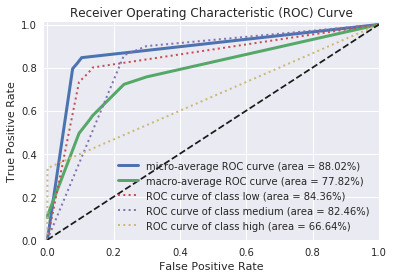

In [63]:
sclf = StackingClassifier(classifiers=[RF, GBC], # , XGBC
                          use_probas=False,
                          average_probas=False,
                          use_features_in_secondary=False,
                          meta_classifier= RF)

sclf.fit(X=X_train,y=y_train)

results = get_results(sclf, 'StackingClassifier', X_test, y_test, 
                      target_names = target_names, results = results, reasume=False)

As you can see we improved the results with our stacked model, although small if compared to what we had already obtained in other ensemble models, it was prove the value of staked methods.

In addition, as you can see we did not lose the ability to evaluate the ROC curve, importance of the characteristics or even to apply the methods of interpretation of the model.

## Conclusion


We have achieved our goal by getting good models were able to create classification models for both the type and the quality of the wine going through all phases in a standard Machine Learning and data mining workflow models like the CRISP-DM model,

The prediction of quality presents some practical applicabilities, like:
- A wine store or or large distributor can qualify new wines, even before acquiring them, and thus better evaluate their purchase cost and their opportunity to sell.
- The result of the model, its interpretation and all the evaluations of EDA provide methods and rules of decision that can help winemakers to look for wines of better qualities.

However, our model has a gap of about 13%. Part of this can be explained by the fact that the quality notes are in fact notes singled out by an expert who take into account other attributes, which are not the physicalchemical ones, and therefore are not present in this data set. The statement of the note is a sensory evaluation, based on the tasting process, just to name a few we would have:
- Others relevant physicals features not present like opacity and viscosity 
- As we have seen, some of the characteristics that we have can influence the smell and taste of the wine, but certainly we do not have all the necessary data, for example the grape variety or type.
- We don't have the tannin, one of the basic wine characteristics. In wine it is the presence of phenolic compounds that add bitterness to a wine.
- The wines traditionally produced in the Verde Region of Portugal are young wines that have high acidity and marked freshness. So the guard time is not so relevant for the classification of this wine, but the harvest is, as in other wines too.


## Next steps
For quality we can:
- Make some different engineering features and polynomials transformations.
- Try a regression model to predict the quality as a number.
- Try a quality classification in the all range of quality.
- Try a tensorflow, but remember, in general, because you don't have a ton of data, the worse overfitting can and will be. That's why you should use a small network.